# Harvard Art Museum Data Analysis Project

Disclaimer: This work includes derogatory language that some people may find profane, vulgar, or offensive. The derogatory terms are used only for the purpose of finding them within museum collections. The inclusion of the offensive language is not meant to promote or condone any discriminatory or harmful beliefs. Reader discretion is advised.

## People
Under Program Director for the Museum Studies program at the Harvard University Extension School, Katherine Burton Jones, in collaboration HAM’s Director of Digital Infrastructure and Emerging Technology, Jeff Steward, Curatorial Assistant at the Harvard University Herbaria ,Madeline Schill, and Harvard Extension School Data Science Graduate Student, Bridget Mullen. 

## Objective
This 2025 spring semester we have been undertaking in a research project initially, focused on unearthing bias or outdated content in HAM’s hidden data fields such as commentary and descriptions. Impressibly, we found almost no evidence of hidden bias or outdated language in these hidden fields. However, we did uncover several issues that require further inquiry, namely:

- A multitude of historically used derogatory terms in forward-facing titles with no forward facing supporting text 

- Object and person culture fields that are largely unorganized and lack a level of specificity needed to represent an artist’s identity, including race, sexual orientation, disability, native culture, and so on. This lack of representation makes it challenging to track the populations represented in museum exhibits and collections, as well as analyze the art from a primary perspective of the artist’s identity.

- A historical underrepresentation of female artists in naming, collecting, and exhibiting their work.


## In the inital analysis we start by identifying some basic properties of the art object records:
### Below we can see when objects were made and acquired.

In [78]:
# import libraries

import pandas as pd
import numpy as np
import requests
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import re
from IPython.display import display, Image, IFrame, HTML
import json
import ast


from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
import nltk
from collections import Counter
import plotly.express as px

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_distances
from sklearn.decomposition import PCA, KernelPCA
import hdbscan 
import umap
from tqdm import tqdm



# set options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth',None)
#pd.set_option('display.max_rows', None)
import warnings 
warnings.filterwarnings('ignore') 

nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/bridgetnevel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/bridgetnevel/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## There are 246,377 objects in the HAM database as of July 5, 2025.

In [3]:
#load to dataframe
#df = pd.read_csv('art_objects.csv')
df = pd.read_csv('HAM_7_5_25-2.csv')
dropped_cols = ['contextualtextcount', 'accesslevel', 'dateoflastpageview', 'totaluniquepageviews', 'markscount',
                'publicationcount', 'totaluniquepageviews', 'contact', 'colorcount', 'rank', 'id', 'state', 
                'verificationleveldescription', 'images','imagecount', 'worktypes', 'imagecount', 'classificationid',
                'standardreferencenumber', 'signed', 'relatedcount', 'verificationlevel', 'titlescount',
                'peoplecount', 'lastupdate', 'periodid', 'edition', 'lendingpermissionlevel', 'colors', 'groupcount',
                'dateoffirstpageview', 'imagepermissionlevel', 'mediacount', 'techniqueid', 
                'seeAlso', 'details', 'videos', 'audio']

df.drop(dropped_cols, axis = 1, inplace = True)
print(f"There are {df.shape[0]} objects in the collection")
print(f"The number of years that there was no data on accession year is {df['accessionyear'].isna().sum()}, which is {round(100* df['accessionyear'].isna().sum()/df.shape[0], 2)}% of the records")
df_acession = df[~df['accessionyear'].isna()]
print(f"The first year that Harvard aquired an object in the collection was {int(df_acession['accessionyear'].min())}.")
print(f"The number of years that there no is data on created year is {(df['dateend']== 0).sum()}, which is {round(100* (df['dateend']== 0).sum()/df.shape[0], 2)}% of the records. ")
print(f"The oldest object in the collection is from {int(df['dateend'].min())}.")

There are 246377 objects in the collection
The number of years that there was no data on accession year is 74150, which is 30.1% of the records
The first year that Harvard aquired an object in the collection was 1765.
The number of years that there no is data on created year is 70737, which is 28.71% of the records. 
The oldest object in the collection is from -6995.


### We see that 30% of the records have a 0 (null) creation date.
### And that 29% have a null value for accession year.

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246377 entries, 0 to 246376
Data columns (total 42 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   copyright        62070 non-null   object 
 1   creditline       246377 non-null  object 
 2   createdate       246377 non-null  object 
 3   division         238618 non-null  object 
 4   terms            237974 non-null  object 
 5   period           36438 non-null   object 
 6   totalpageviews   246377 non-null  int64  
 7   accessionyear    172227 non-null  float64
 8   classification   246377 non-null  object 
 9   primaryimageurl  222869 non-null  object 
 10  style            2251 non-null    object 
 11  commentary       2426 non-null    object 
 12  technique        168884 non-null  object 
 13  description      36690 non-null   object 
 14  medium           106110 non-null  object 
 15  title            246374 non-null  object 
 16  accessionmethod  246377 non-null  obje

In [79]:
df = df.sort_values(by='dateend')
df[:1]

,copyright,creditline,createdate,division,terms,period,totalpageviews,accessionyear,classification,primaryimageurl,style,commentary,technique,description,medium,title,accessionmethod,provenance,related,dated,department,dateend,titles,people,url,century,places,objectnumber,labeltext,datebegin,culture,exhibitioncount,objectid,dimensions,marks,exhibitions,publications,gallery,groupings,tags,contextualtext,media
195138,NaN,"Harvard Art Museums/Arthur M. Sackler Museum, Bequest of Grenville L. Winthrop",2005-09-06T00:00:00-04:00,Asian and Mediterranean Art,"{'culture': [{'name': 'Chinese', 'id': 37527174}], 'topic': [{'name': 'Artstor Digital Library', 'id': 2040173}, {'name': 'Google Art Project', 'id': 2040174}], 'medium': [{'name': 'Stone', 'id': 2028228}], 'place': [{'name': 'East Asia', 'id': 2028303}, {'name': 'China', 'id': 2028317}]}",Neolithic period,206,1943.0,Ritual Implements,https://nrs.harvard.edu/urn-3:HUAM:763617,NaN,NaN,NaN,NaN,Serpentine,Jade Mace Head (?),Bequest,"Grenville L. Winthrop, New York (by 1943), bequest; to Fogg Art Museum, 1943.",NaN,c. 7000 BCE,Department of Asian Art,-6995,"[{'titletype': 'Title', 'titleid': 497194, 'displayorder': 1, 'title': 'Jade Mace Head (?)'}]",NaN,https://www.harvardartmuseums.org/collections/object/204605,NaN,"[{'displayname': 'East Asia, China', 'confidence': None, 'placeid': 2028317, 'type': 'Creation Place'}]",1943.50.635,"Before the advent of metallurgy, numerous Neolithic cultures — which relied primarily upon stone tools, farming, domesticated animals, and pottery making — were scattered throughout vast regions of China. The cultures that produced the most remarkable earthenware (ceramics fired up to about 1000° C) tended to inhabit areas along China’s major rivers, and by the late Neolithic period (c. 5000–c. 2000 BCE), two notable ceramic types distinguished themselves from coarser utilitarian pottery — painted earthenware from settlements along the upper and middle reaches of the Yellow River, and black pottery from cultures near the lower Yellow and Yangzi River valleys. Painted ceramics were hand-built, made of fine reddish or buff clays, and embellished with dark slip (liquid clay) to create vibrant, mostly abstract designs. Black pottery vessels were wheel-thrown, sometimes to the thinness of an eggshell, blackened during the firing process, and burnished to a high gloss. These delicate objects were impractical for daily use and were likely used for ceremonial purposes. Several Neolithic cultures also fashioned beautiful jades or hard stones — usually nephrite, an extremely hard mineral native to China — into ceremonial tools and weapons, ritual objects, or items of personal adornment. These jades were sliced, shaped, perforated, incised, and polished using non-metallic tools and abrasive crystals of even greater hardness than the jade itself, a painstakingly labor-intensive process that only the privileged could afford.",-7005,Chinese,1,204605,H. 16.5 x W. 11 x D. 3.8 cm (6 1/2 x 4 5/16 x 1 1/2 in.)\r\nWeight 630 g,NaN,"[{'begindate': '2014-11-16', 'enddate': '2050-01-01', 'citation': '<em>32Q: 1740 Early China I</em>, Harvard Art Museums, 11/16/2014 - 01/01/2050', 'exhibitionid': 4476, 'title': '32Q: 1740 Early China I'}]","[{'publicationplace': 'Cambridge, MA', 'volumetitle': None, 'citation': 'Max Loehr and Louisa G. Fitzgerald Huber, Ancient Chinese Jades from the Grenville L. Winthrop Collection in the Fogg Art Museum, Harvard University (Cambridge, MA, Fogg Art Museum, 1975).', 'publicationyear': 1975, 'citationremarks': None, 'pagenumbers': 'cat. no. 584, p. 405', 'format': 'Manuscript', 'publicationid': 14084, 'title': 'Ancient Chinese Jades from the Grenville L. Winthrop Collection in the Fogg Art Museum, Harvard University', 'volumenumber': None, 'publicationdate': '1975'}, {'publicationplace': 'Cambridge, MA', 'volumetitle': None, 'citation': 'Jenny So, <em>Early Chinese Jades in the Harvard Art Museums</em> (Cambridge, MA, 2019)', 'publicationyear':

### 70738 (30%) objects have a 0 value created date.  74150 (29%) objects have no accession year

In [38]:
print(f"There are {df[df.dateend == 0].shape[0]} objects that have a 0 value date")
print(f"There are {df[df.dateend.isna()].shape[0]} objects that have a NA value date")
print(f"There are {df[df.accessionyear.isna()].shape[0]} objects that have NA accession year")
print(f"There are {df[df.accessionyear== 0].shape[0]} objects that have a 0 value accession year")

There are 70737 objects that have a 0 value date
There are 0 objects that have a NA value date
There are 74150 objects that have NA accession year
There are 0 objects that have a 0 value accession year


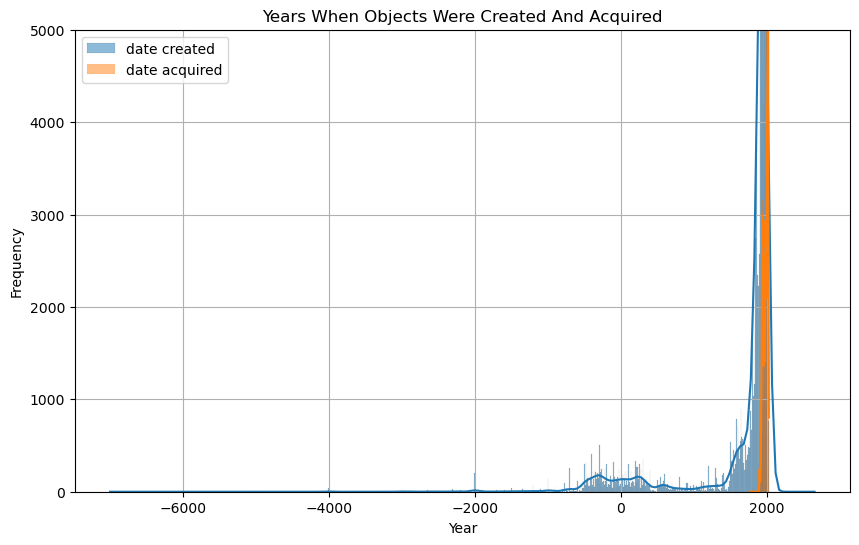

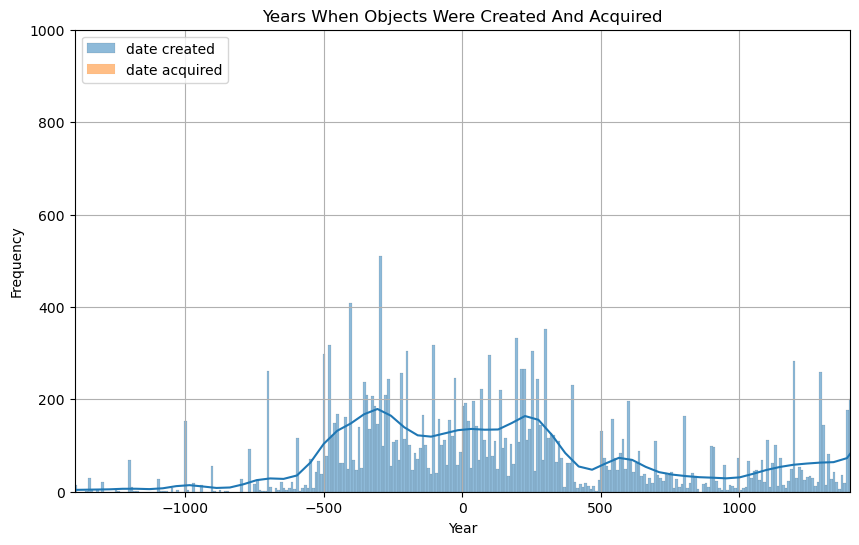

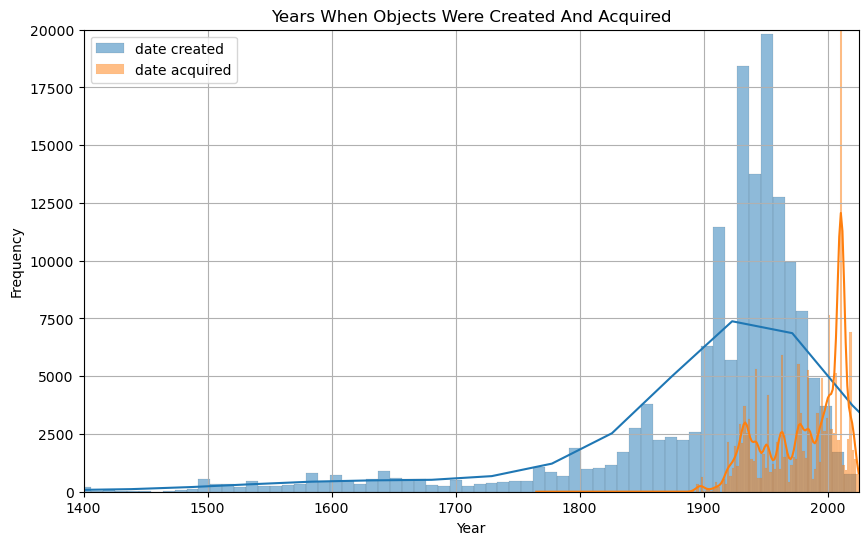

In [7]:
year_df = df[df['dateend']!= 0]
plt.figure(figsize=(10, 6))
sns.histplot(data=year_df, x='dateend', kde=True, label = 'date created', bins = 1000)
sns.histplot(data=df_acession, x='accessionyear', kde=True, label = 'date acquired')
plt.title('Years When Objects Were Created And Acquired')
plt.xlabel('Year')
plt.ylabel('Frequency')
#plt.xlim(-2000, 2025)
plt.ylim(0, 5000)
plt.grid(True)
plt.legend(loc='upper left')
plt.show()

year_df = df[df['dateend']!= 0]
plt.figure(figsize=(10, 6))
sns.histplot(data=year_df, x='dateend', kde=True, label = 'date created', bins = 1000)
sns.histplot(data=df_acession, x='accessionyear', kde=True, label = 'date acquired')
plt.title('Years When Objects Were Created And Acquired')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.xlim(-1400, 1400)
plt.ylim(0, 1000)
plt.grid(True)
plt.legend(loc='upper left')
plt.show()

year_df = df[df['dateend']!= 0]
plt.figure(figsize=(10, 6))
sns.histplot(data=year_df, x='dateend', kde=True, label = 'date created', bins = 1000)
sns.histplot(data=df_acession, x='accessionyear', kde=True, label = 'date acquired')
plt.title('Years When Objects Were Created And Acquired')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.xlim(1400, 2025)
plt.ylim(0, 20000)
plt.grid(True)
plt.legend(loc='upper left')
plt.show()

## What divsions are objects from and what kind of objects are they?

3.15 percent of records do not have a division.


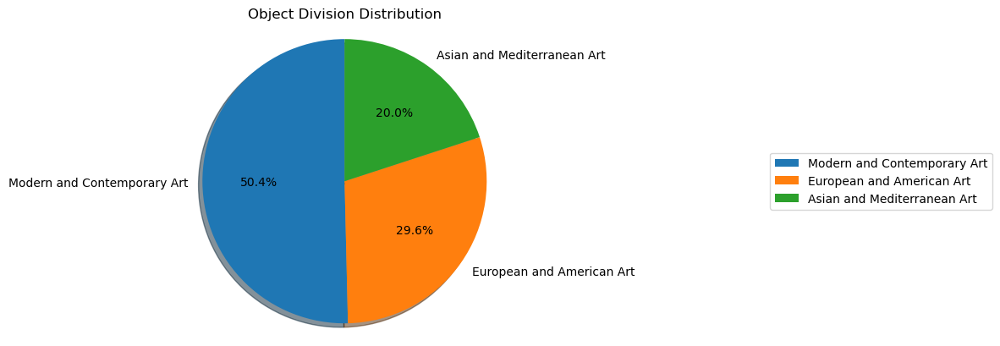

There are 60 different classes of objects


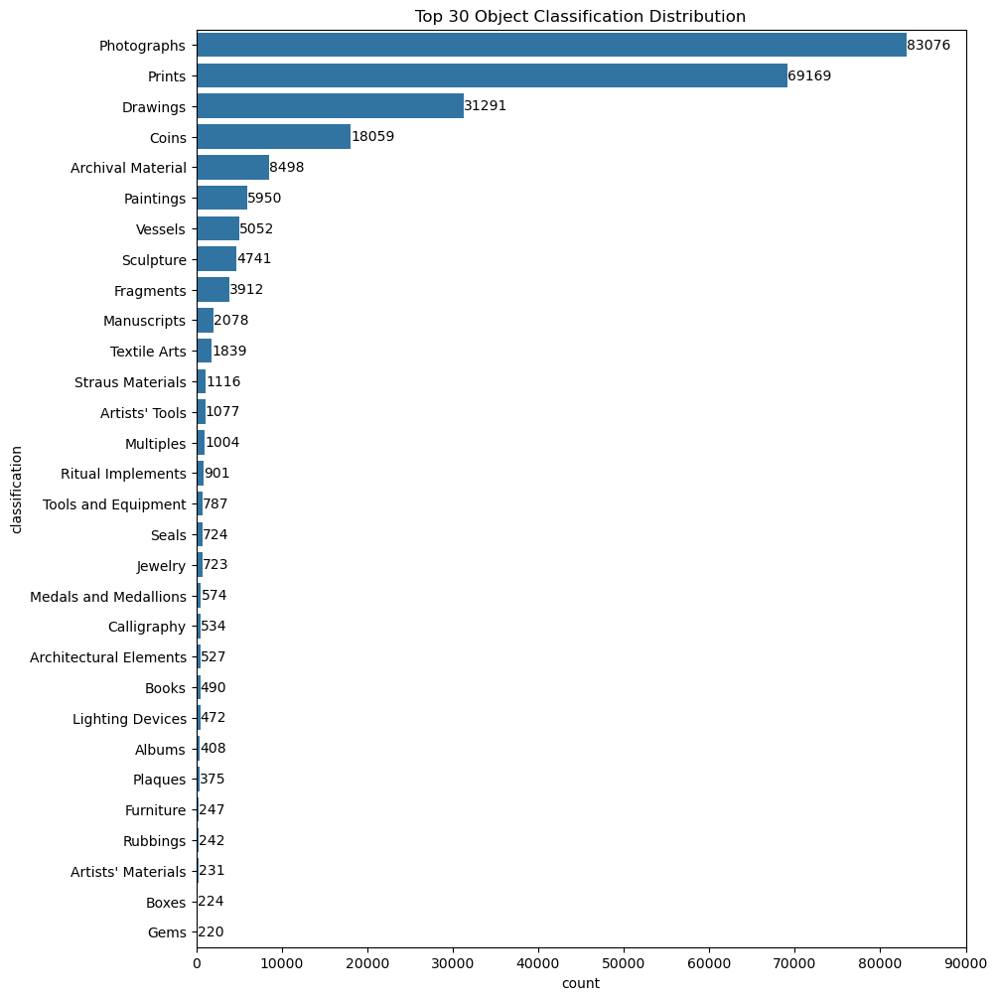

In [8]:
print(f"{round(100* df['division'].isna().sum()/df.shape[0],2)} percent of records do not have a division.")
div_df = df[~df['division'].isna()]
div_df = pd.DataFrame(div_df['division'].value_counts())
div_df.plot.pie(y='count', labels= div_df.index, autopct='%1.1f%%', startangle=90, shadow=True, ylabel='')

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Object Division Distribution')

plt.legend(loc='center left', bbox_to_anchor=(1.5, 0.5))
plt.show()

print(f"There are {len(df.classification.unique())} different classes of objects")

fig, ax = plt.subplots(figsize=(10, 12)) 
class_df = pd.DataFrame(df['classification'].value_counts(dropna= False))
top_class_df = class_df.iloc[0:30]
ax = sns.barplot(x='count', y='classification', data=top_class_df, orient='h')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top 30 Object Classification Distribution')
ax.set_xlim(0,90000)
plt.show()

## What cultures are objects from?
Here we see that there are numerous, somewhat disorganized culture fields. This is the entry for the object's culture, not necessarily the artist's.

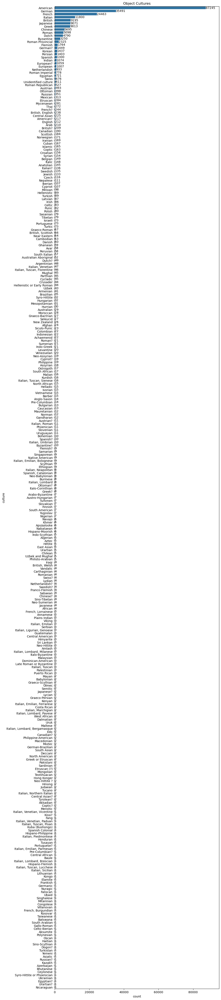

In [9]:
plt.figure(figsize=(10, 60))

culture_df = pd.DataFrame(df['culture'].value_counts())
ax=sns.barplot(x='count', y='culture', data=culture_df, orient='h')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Object Cultures')
ax.set_xlim(0,95000)
# Show the plot
plt.show()

## Pulling records with offensive keywords.
Here we can do an inital scan for some offensive keywords. Examples are as follows:
* negro
* n****r
* savage
* indian
* oriental

### One group of records that immediately comes up is the **Social Museum Collection**. An important record of American history... derogatory keywords such as: Negroes, Jews, Indians, Cripples, Insane, Destitute occur with some regularity in the titles of these images with no disclaimer.

In [10]:
def show_record(title):
    row = df[df['title']== title]
    print(row['title'].values[0])
    image_path = row['primaryimageurl'].values[0]
    display(Image(url = image_path, width = 400))
def show_label(title):
    row = df[df['title']== title]
    print(row['labeltext'].values[0])

In [11]:
show_record("Races, Negroes: United States. Virginia. Hampton. Hampton Normal and Industrial School: Agencies Promoting Assimilation of the Negro: Development of Social Standards Among the Negroes. Hampton Normal and Agricultural Institute, Hampton, Va.: Geography - Local Industry.")

Races, Negroes: United States. Virginia. Hampton. Hampton Normal and Industrial School: Agencies Promoting Assimilation of the Negro: Development of Social Standards Among the Negroes. Hampton Normal and Agricultural Institute, Hampton, Va.: Geography - Local Industry.


## Examples of Records that contain derogatory terms

In [12]:
show_record('Negro Mounted Upon a Rearing Horse')
show_record("Negro in a Punt in a Landscape")
show_record("Negro Huts, near Wilminton, North Carolina")
show_record("Negro Page")
show_record("The Negro")
show_record('Lo, the Poor Indian')
show_record("The Franciscan and the Indian")
show_record("The Oriental Peasant and His Family")
show_record('Oriental Hunters Chasing Stags')
show_record('Oriental Hunters Killing Monkeys')
show_record("An Oriental Holding a Horse")
show_record("Oriental Dancer")
show_record("Mulatto and African Slaves")
show_record("Cripple with a Crutch and a Wooden Leg")

Negro Mounted Upon a Rearing Horse


Negro in a Punt in a Landscape


Negro Huts, near Wilminton, North Carolina


Negro Page


The Negro


Lo, the Poor Indian


The Franciscan and the Indian


The Oriental Peasant and His Family


Oriental Hunters Chasing Stags


Oriental Hunters Killing Monkeys


An Oriental Holding a Horse


Oriental Dancer


Mulatto and African Slaves


Cripple with a Crutch and a Wooden Leg


## Example of records where an attempt has been made to deal with derogatory terms

In [13]:
show_record('Two Women of Color, Dominica [French Mulatress of Dominica and a Negro Woman in their Proper Dress]')
show_record('Negro Soldier')
show_label('Negro Soldier')
print(" ")
show_record("Woman of Mixed Race")
show_label("Woman of Mixed Race")

Two Women of Color, Dominica [French Mulatress of Dominica and a Negro Woman in their Proper Dress]


Negro Soldier


Robert Smullyan Sloan was drafted into the army in 1943 and stationed in New York, where he illustrated educational materials for the armed services and produced posters for the U.S. Treasury’s war bond campaign. In this painstakingly detailed composition reminiscent of early Flemish painting, he portrays a U.S. Army private wearing a dress uniform with ribbons designating a Good Conduct Medal and participation in the European–African–Middle Eastern Campaign. The artist’s title, however, accords him only the designation of his race, using the language of that historical moment.
African Americans fought a two-front battle during World War II, facing enemies overseas and racism at home. The view out the window in Sloan’s work alludes to the distinguished soldier’s dreary prospects upon his return to the gritty urban environment of 125th Street in Harlem.
 
Woman of Mixed Race


A growing metropolis in the early 20th century, Berlin attracted diverse ethnic groups, particularly in the realms of art and theater. When he visited, Nolde avidly depicted scenes of modern urban life, including this portrait of a stage performer. The bright yellow circle surrounding the woman like a halo evokes a mirror, and the garish orange of the background reflects the gaslight backstage. Nolde’s title for this painting refers to the subject’s mixed-race heritage. In common use then, the term is now considered offensive for the way it devalues people based on their Black ancestry. The year Nolde painted this work, 1913, was the same year legislation was passed in Germany that made “German blood” the sole criterion for citizenship, as a way to exclude Germans of African descent — a law that was changed only in 2000. Represented here in vibrant colors, the unnamed subject lived and worked in Germany despite having no legal protection. Race is central to recent deconstructions of No

In [80]:
def search_string_in_dataframe(df, search_string, case_sensitive=False):
    """
    Searches for a string in any field of a Pandas DataFrame.

    Args:
        df (pd.DataFrame): The DataFrame to search within.
        search_string (str): The string to search for.
        case_sensitive (bool, optional): Whether the search is case-sensitive. Defaults to False.

    Returns:
         pd.DataFrame: A DataFrame containing rows where the string was found, or an empty DataFrame if not found.
    """
    mask = df['title'].astype(str).str.contains(search_string, case=case_sensitive, na=False).values
    #mask = np.column_stack([df[col].astype(str).str.contains(search_string, case=case_sensitive, na=False).values for col in df])
    
    return df[mask]

In [81]:

l = search_string_in_dataframe( df, "Seven little Indians" )
image_path =l['url'].values[0]
display(HTML(url = image_path))

i = search_string_in_dataframe( df, "Indian Chiefs Who" )
image_path =i['url'].values[0]
display(HTML(url = image_path))

n = search_string_in_dataframe( df, "Free Nig" )
image_path =n['url'].values[0]
display(HTML(url = image_path))

## We also looked at representation within the Art collections. We started by looking at the Gender of Artists.

In [16]:
df_list = []
data = df.people.values

for json_string in data:
    if pd.isna(json_string):
        df_list.append(None)
    else:
        try:
            # First try direct JSON parsing
            parsed_data = json.loads(json_string)
        except json.JSONDecodeError:
            try:
                # Try fixing common issues
                json_string_fixed = json_string.replace("'", '"')
                parsed_data = json.loads(json_string_fixed)
            except json.JSONDecodeError:
                try:
                    # Last resort - use ast.literal_eval for Python-like syntax
                    parsed_data = ast.literal_eval(json_string)
                except (ValueError, SyntaxError) as e:
                    print(f"Failed to parse: {json_string}")
                    print(f"Error: {str(e)}")
                    parsed_data = None
        
        if parsed_data is not None:
            try:
                normalized_df = pd.json_normalize(parsed_data)
                df_list.append(normalized_df)
            except Exception as e:
                print(f"Normalization failed for: {parsed_data}")
                print(f"Error: {str(e)}")
                df_list.append(None)
        else:
            df_list.append(None)

# Store results
df['people_df'] = df_list

# Show first 2 successful parses
#print([x for x in df_list[:2] if x is not None])

# For multiple entries per row (if people_df contains multiple rows):
df['genders'] = df['people_df'].apply(lambda x: list(x['gender']) if isinstance(x, pd.DataFrame) and 'gender' in x.columns else [])

#print(df['genders'].value_counts())
# Create a mask for lists containing 'female' AND NOT containing 'male'
fem_mask = (
    df['genders'].apply(lambda x: 'female' in x if isinstance(x, list) else False) & 
    ~df['genders'].apply(lambda x: 'male' in x if isinstance(x, list) else False)
)

masc_mask = (
    ~df['genders'].apply(lambda x: 'female' in x if isinstance(x, list) else False) & 
    df['genders'].apply(lambda x: 'male' in x if isinstance(x, list) else False)
)

unknown_mask = (
    ~df['genders'].apply(lambda x: 'female' in x if isinstance(x, list) else False) & 
    ~df['genders'].apply(lambda x: 'male' in x if isinstance(x, list) else False) 
   
)
# Filter the DataFrame
fem_only_df = df[fem_mask]
male_only_df = df[masc_mask]
unkn_df = df[unknown_mask]

# Create the new column
df['male/female'] = [
    'female' if fem else 
    'male' if masc else 
    'unknown' 
    for fem, masc in zip(fem_mask, masc_mask)
]

print(f"There are {len(fem_only_df)} objects attributed to females and {len(male_only_df)} \
objects attributed to males. There are {len(unkn_df)} objects which are attributed to \
people of unknown gender. This give us {round(len(fem_only_df)/len(df)*100, 2)} percent female, and \
{round(len(male_only_df)/len(df)*100, 2)} male, {round(len(unkn_df)/len(df)*100, 2)} percent unknown or mixed gender attributed items.")

There are 5647 objects attributed to females and 151220 objects attributed to males. There are 88714 objects which are attributed to people of unknown gender. This give us 2.29 percent female, and 61.38 male, 36.01 percent unknown or mixed gender attributed items.


In [17]:
display(pd.DataFrame(df.genders.value_counts()))

,count
genders,
[male],126139
[unknown],52186
[],31393
"[male, male]",11114
"[male, unknown]",7715
[female],5162
"[unknown, unknown]",3127
"[unknown, male]",2954
[unidentified],1226


## After some analysis, we see that of the approximately 250K items, 2.3% are female-attributed, 61.4% are male-attributed,and the remaining 35.97% are attributed to an unknown gender.
Likely, there are far more objects made by women than are attributed to them in the records. One area where this could be amended is within categories where objects would have been traditionally made by women: pottery, textiles, etc. 

## Below we plot artist's gender by year. Some observations are:
* Objects where a creation date is not known (here marked as year 0) are disproportionately attributed to men over being unknown or female.
* Most of the pre 1500 objects are of unknown gender aside from a cluster of male attributed items between years 0 and 600.
* There is an exponential increase in male attributed objects beginning around 1500 and peaking at 2000. 
* The only female attributed items exist in a cluster beginning around 1900 with a linear increase also peaking at the year 2000.

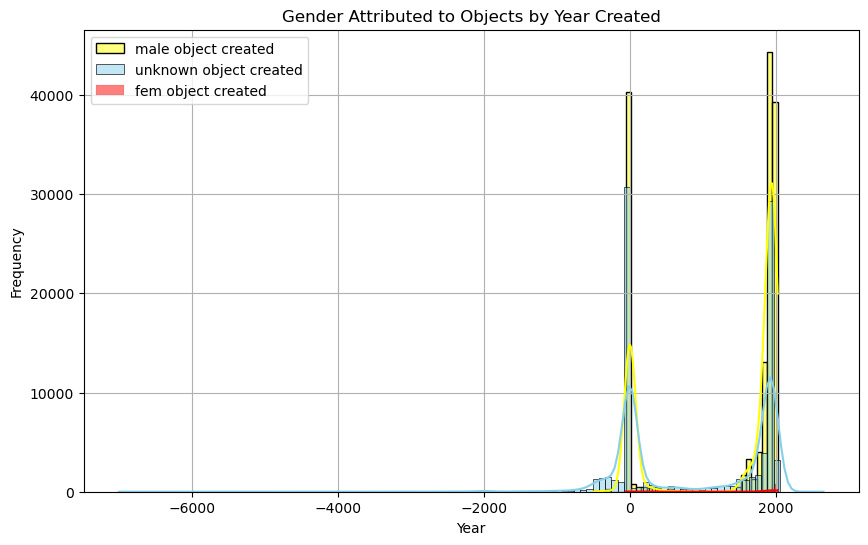

In [18]:
plt.figure(figsize=(10, 6))

sns.histplot(data=male_only_df, x='dateend', kde=True, color = 'yellow', label = "male object created")
sns.histplot(data=unkn_df, x='dateend', kde=True, color="skyblue", label = "unknown object created")
sns.histplot(data=fem_only_df, x='dateend', kde=True, color = 'red', label = "fem object created")
plt.title('Gender Attributed to Objects by Year Created')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

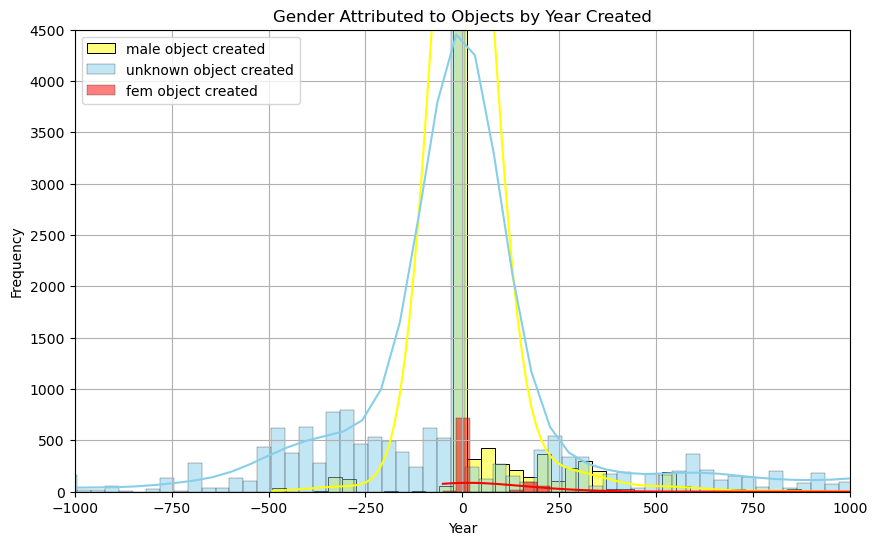

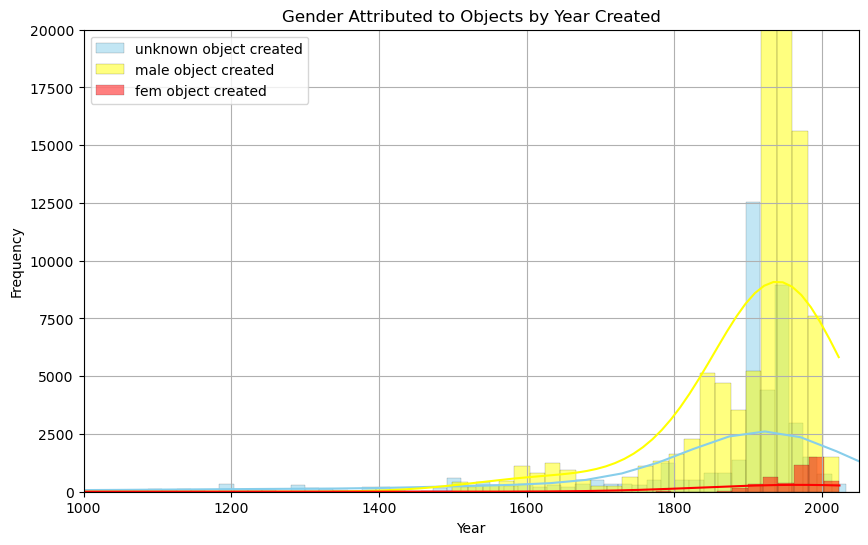

In [19]:
plt.figure(figsize=(10, 6))

sns.histplot(data=male_only_df, x='dateend', kde=True, color = 'yellow', label = "male object created",bins=70)
sns.histplot(data=unkn_df, x='dateend', kde=True, color="skyblue", label = "unknown object created", bins = 270)
sns.histplot(data=fem_only_df, x='dateend', kde=True, color = 'red', label = "fem object created", bins= 60)
plt.title('Gender Attributed to Objects by Year Created')
plt.xlim(-1000, 1000)
plt.ylim(0, 4500)
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))

sns.histplot(data=unkn_df, x='dateend', kde=True, color="skyblue", label = "unknown object created", bins = 500)
sns.histplot(data=male_only_df, x='dateend', kde=True, color = 'yellow', label = "male object created", bins = 120)
sns.histplot(data=fem_only_df, x='dateend', kde=True, color = 'red', label = "fem object created", bins = 100)
plt.title('Gender Attributed to Objects by Year Created')
plt.xlim(1000, 2050)
plt.ylim(0, 20000)
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

## Looking a little more closely at gender trends in the last 75 years we see:
### A dramatic Increase in proportion of female-attributed items
Beginning in the year 2010 the percentage of objects collected attributed to men have begun to decrease while the percentage attributed to women had increased. This shift is dramatic. Near 2018 the percentage of female attributed objects overtook the male reaching a ratio as high as 100:1 in the last few years.

In [20]:
recent_women = ((fem_only_df['dateend']<= 1975) & (fem_only_df['dateend']>= 1950)).sum()
recent_men = ((male_only_df['dateend']<= 1975) & (male_only_df['dateend']>= 1950)).sum()
recent_unknown = ((unkn_df['dateend']<= 1975) & (unkn_df['dateend']>= 1950)).sum()
total = recent_women + recent_men + recent_unknown
print(f"From objects made between 1950-1975 {round(recent_women/total *100,2)} percent were attributed to women while \
{round(recent_men/total *100,2)} percent were attributed to men and {round(recent_unknown/total *100,2)} percent were unknown.")

recent_women = ((fem_only_df['dateend']<= 2000) & (fem_only_df['dateend']>= 1975)).sum()
recent_men = ((male_only_df['dateend']<= 2000) & (male_only_df['dateend']>= 1975)).sum()
recent_unknown = ((unkn_df['dateend']<= 2000) & (unkn_df['dateend']>= 1975)).sum()
total = recent_women + recent_men + recent_unknown
print(f"From objects made between 1975-2000 {round(recent_women/total *100,2)} percent were attributed to women while \
{round(recent_men/total *100,2)} percent were attributed to men and {round(recent_unknown/total *100,2)} percent were unknown.")

recent_women = (fem_only_df['dateend']>= 2000).sum()
recent_men = (male_only_df['dateend']>= 2000).sum()
recent_unknown = (unkn_df['dateend']>= 2000).sum()
total = recent_women + recent_men + recent_unknown
print(f"From objects made between 2000-2025 {round(recent_women/total *100,2)} percent were attributed to women while \
{round(recent_men/total *100,2)} percent were attributed to men and {round(recent_unknown/total *100,2)} percent were unknown.")

From objects made between 1950-1975 2.34 percent were attributed to women while 77.0 percent were attributed to men and 20.66 percent were unknown.
From objects made between 1975-2000 11.99 percent were attributed to women while 76.29 percent were attributed to men and 11.72 percent were unknown.
From objects made between 2000-2025 18.79 percent were attributed to women while 58.65 percent were attributed to men and 22.56 percent were unknown.


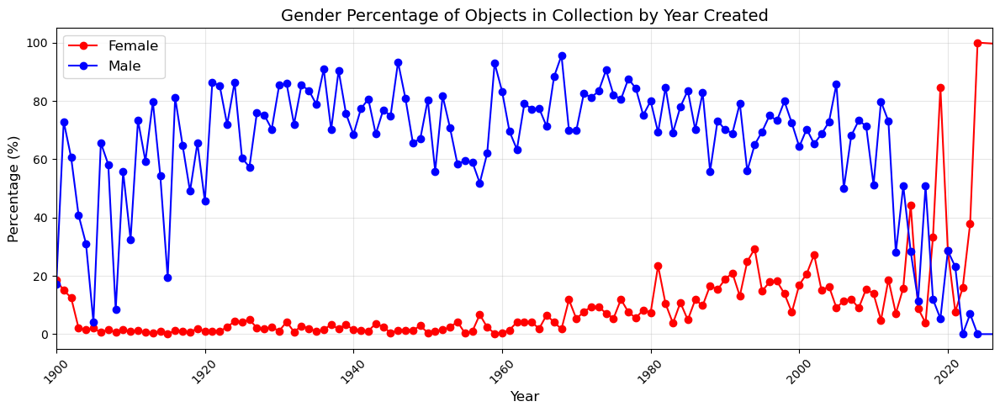

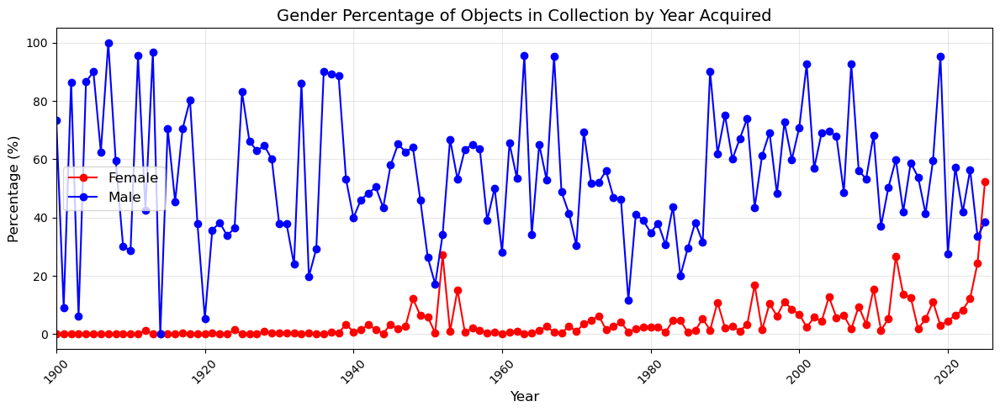

In [21]:
gender_by_year = (
    df.groupby(['dateend', 'male/female'])
    .size()
    .unstack(fill_value=0)
)
gender_by_year = gender_by_year.div(gender_by_year.sum(axis=1), axis=0) * 100

# 3. Plot the results
plt.figure(figsize=(12, 5))

# Plot female percentage
plt.plot(gender_by_year.index, gender_by_year['female'], 
         label='Female', color='red', marker='o')

# Plot male percentage
plt.plot(gender_by_year.index, gender_by_year['male'], 
         label='Male', color='blue', marker='o')

# Formatting
plt.title('Gender Percentage of Objects in Collection by Year Created', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# Rotate x-axis labels if many years
if len(gender_by_year) > 10:
    plt.xticks(rotation=45)
    plt.xlim(1900, 2026)

plt.tight_layout()
plt.show()

gender_by_year = (
    df.groupby(['accessionyear', 'male/female'])
    .size()
    .unstack(fill_value=0)
)
gender_by_year = gender_by_year.div(gender_by_year.sum(axis=1), axis=0) * 100

# 3. Plot the results
plt.figure(figsize=(12, 5))

# Plot female percentage
plt.plot(gender_by_year.index, gender_by_year['female'], 
         label='Female', color='red', marker='o')

# Plot male percentage
plt.plot(gender_by_year.index, gender_by_year['male'], 
         label='Male', color='blue', marker='o')

# Formatting
plt.title('Gender Percentage of Objects in Collection by Year Acquired', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# Rotate x-axis labels if many years
if len(gender_by_year) > 10:
    plt.xticks(rotation=45)
    plt.xlim(1900, 2026)

plt.tight_layout()
plt.show()

## Why was there a sudden drop in the percent of number of artworks made by men in the 2020s?
Many recent artwork 'people' fields contain an unknown gender

In [22]:
df[df['dateend']>= 2020][['dateend', 'people_df', 'male/female']]

,dateend,people_df,male/female
82367,2020,"role birthplace gender displaydate prefix culture \ 0 Artist Ilé-If?`, Nigeria female born 1985 None American displayname alphasort name personid \ 0 Toyin Ojih Odutola Ojih Odutola, Toyin Toyin Ojih Odutola 68282 deathplace displayorder 0 None 1",female
82368,2020,"role birthplace gender displaydate prefix culture \ 0 Artist Ilé-If?`, Nigeria female born 1985 None American displayname alphasort name personid \ 0 Toyin Ojih Odutola Ojih Odutola, Toyin Toyin Ojih Odutola 68282 deathplace displayorder 0 None 1",female
82369,2020,"role birthplace gender displaydate prefix culture \ 0 Artist Ilé-If?`, Nigeria female born 1985 None American displayname alphasort name personid \ 0 Toyin Ojih Odutola Ojih Odutola, Toyin Toyin Ojih Odutola 68282 deathplace displayorder 0 None 1",female
82521,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist San Francisco, CA male born 1969 None American Will Wilson alphasort name personid deathplace displayorder 0 Wilson, Will Will Wilson 68321 None 1",male
83270,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist None unknown born 1971 None None Hong Chun Zhang 張春紅 alphasort name personid deathplace displayorder 0 Zhang, Hong Chun Hong Chun Zhang 張春紅 68583 None 1",unknown
83271,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist None unknown born 1971 None None Hong Chun Zhang 張春紅 alphasort name personid deathplace displayorder 0 Zhang, Hong Chun Hong Chun Zhang 張春紅 68583 None 1",unknown
83272,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist None unknown born 1971 None None Hong Chun Zhang 張春紅 alphasort name personid deathplace displayorder 0 Zhang, Hong Chun Hong Chun Zhang 張春紅 68583 None 1",unknown
83273,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist None unknown born 1971 None None Hong Chun Zhang 張春紅 alphasort name personid deathplace displayorder 0 Zhang, Hong Chun Hong Chun Zhang 張春紅 68583 None 1",unknown
83433,2021,"role birthplace gender displaydate prefix culture \ 0 Artist None male born 1969 None American displayname alphasort \ 0 Michael Cherney (also known as Qiu Mai 秋麥) Cherney, Michael name personid deathplace \ 0 Michael Cherney (also known as Qiu Mai 秋麥) 55097 None displayorder 0 1",male
83535,2020,"role birthplace gender displaydate prefix culture displayname \ 0 Artist New York, NY female born 1951 None American Arlene Shechet alphasort name personid deathplace displayorder 0 Shechet, Arlene Arlene Shechet 65650 None 1",female


## Let's do the same alaysis but with objects that are eventually exhibited. 
### We see the same shift here but much more gradual.

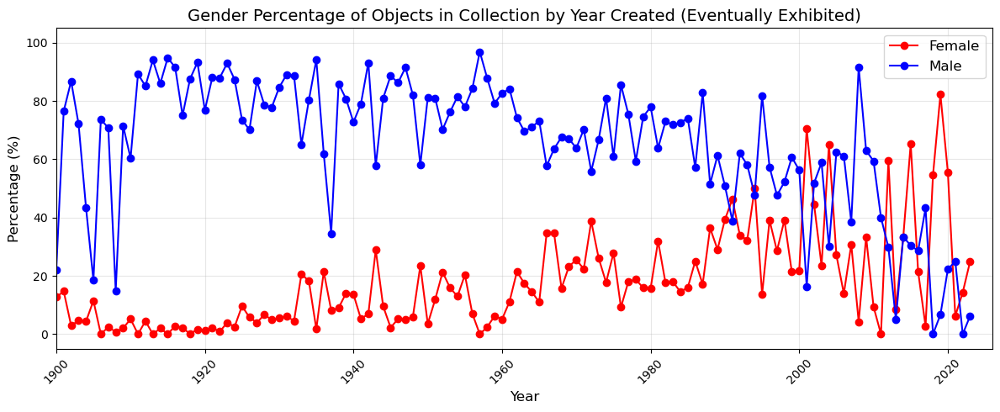

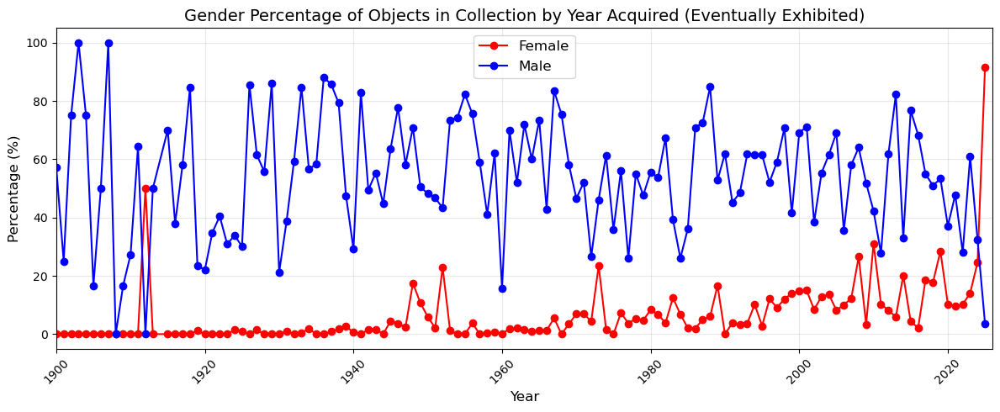

In [23]:
exhibited_df = df[df['exhibitioncount']>0]
gender_by_year = (
    exhibited_df.groupby(['dateend', 'male/female'])
    .size()
    .unstack(fill_value=0)
)
gender_by_year = gender_by_year.div(gender_by_year.sum(axis=1), axis=0) * 100

# 3. Plot the results
plt.figure(figsize=(12, 5))

# Plot female percentage
plt.plot(gender_by_year.index, gender_by_year['female'], 
         label='Female', color='red', marker='o')

# Plot male percentage
plt.plot(gender_by_year.index, gender_by_year['male'], 
         label='Male', color='blue', marker='o')

# Formatting
plt.title('Gender Percentage of Objects in Collection by Year Created (Eventually Exhibited)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# Rotate x-axis labels if many years
if len(gender_by_year) > 10:
    plt.xticks(rotation=45)
    plt.xlim(1900, 2026)

plt.tight_layout()
plt.show()

exhibited_df = df[df['exhibitioncount']>0]
gender_by_year = (
    exhibited_df.groupby(['accessionyear', 'male/female'])
    .size()
    .unstack(fill_value=0)
)
gender_by_year = gender_by_year.div(gender_by_year.sum(axis=1), axis=0) * 100

# 3. Plot the results
plt.figure(figsize=(12, 5))

# Plot female percentage
plt.plot(gender_by_year.index, gender_by_year['female'], 
         label='Female', color='red', marker='o')

# Plot male percentage
plt.plot(gender_by_year.index, gender_by_year['male'], 
         label='Male', color='blue', marker='o')

# Formatting
plt.title('Gender Percentage of Objects in Collection by Year Acquired (Eventually Exhibited)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# Rotate x-axis labels if many years
if len(gender_by_year) > 10:
    plt.xticks(rotation=45)
    plt.xlim(1900, 2026)

plt.tight_layout()
plt.show()

## Looking at what 'culture' female artists are from

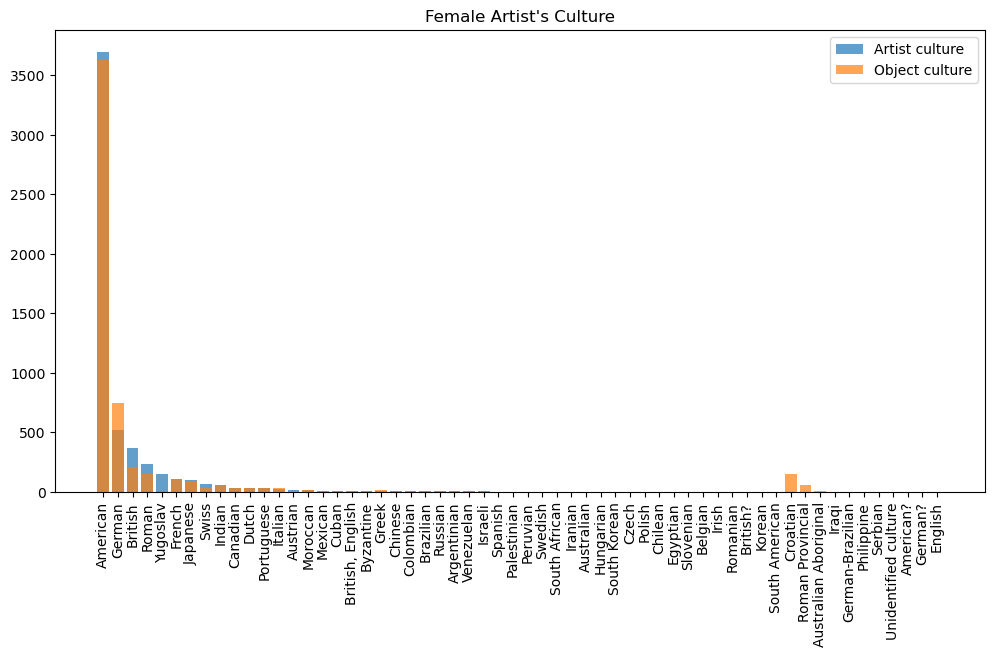

In [24]:
# For multiple entries per row (if people_df contains multiple rows):
df['artist_cultures'] = df['people_df'].apply(lambda x: list(x['culture']) if isinstance(x, pd.DataFrame) and 'culture' in x.columns else [])
df['artist_main_culture'] = df['artist_cultures'].apply(lambda x: x[0] if isinstance(x, list) and x != [] else [])

female_cultures = df[df['male/female'] == 'female']['artist_main_culture'].value_counts()
f_art_cultures = df[df['male/female'] == 'female']['culture'].value_counts()

plt.figure(figsize=(12,6))
plt.bar(height = female_cultures, x = female_cultures.index, label = 'Artist culture', alpha = .7)
plt.bar(height = f_art_cultures, x = f_art_cultures.index, label = 'Object culture', alpha = .7)
plt.xticks(rotation=90)
plt.title("Female Artist's Culture")
plt.legend()
plt.show()

## We can look at trends in the gender of artists exhibited each year

In [25]:
exhibited_df.head(1)

,copyright,creditline,createdate,division,terms,period,totalpageviews,accessionyear,classification,primaryimageurl,style,commentary,technique,description,medium,title,accessionmethod,provenance,related,dated,department,dateend,titles,people,url,century,places,objectnumber,labeltext,datebegin,culture,exhibitioncount,objectid,dimensions,marks,exhibitions,publications,gallery,groupings,tags,contextualtext,media,people_df,genders,male/female
77,NaN,"Harvard Art Museums/Fogg Museum, Gift of Edward W. Forbes",1997-10-23T00:00:00-04:00,European and American Art,"{'century': [{'name': '19th century', 'id': 37525806}], 'culture': [{'name': 'Italian', 'id': 37527759}], 'place': [{'name': 'Europe', 'id': 2028188}, {'name': 'Italy', 'id': 2028189}, {'name': 'Tuscany', 'id': 2028190}, {'name': 'Florence', 'id': 2028191}]}",NaN,8,1921.0,Prints,https://nrs.harvard.edu/urn-3:HUAM:INV173270_dynmc,NaN,NaN,Engraving,NaN,Engraving with stenciled opaque watercolor on card,Playing Card: Nine of Coins,Gift,"Edward Waldo Forbes, gift; to Fogg Art Museum, 1921",NaN,19th century,Department of Prints,0,"[{'titletype': 'Title', 'titleid': 781788, 'displayorder': 1, 'title': 'Playing Card: Nine of Coins'}, {'titletype': 'Former Title', 'titleid': 619669, 'displayorder': 2, 'title': 'Card XXXVII'}, {'titletype': 'Series/Book Title', 'titleid': 355846, 'displayorder': 3, 'title': 'Tarots Playing Cards for Florentine Game of Minchiate, Complete Set of 97 Cards'}]","[{'role': 'Artist', 'birthplace': None, 'gender': 'unknown', 'displaydate': None, 'prefix': None, 'culture': None, 'displayname': 'Unidentified Artist', 'alphasort': 'Unidentified Artist', 'name': 'Unidentified Artist', 'personid': 34147, 'deathplace': None, 'displayorder': 1}]",https://www.harvardartmuseums.org/collections/object/251574,19th century,"[{'displayname': 'Europe, Italy, Tuscany, Florence', 'confidence': None, 'placeid': 2028191, 'type': 'Creation Place'}]",M2024,NaN,0,Italian,1,251574,NaN,NaN,"[{'begindate': '2014-11-16', 'enddate': '2050-01-01', 'citation': '<em>32Q: 2220 18th-19th Century</em>, Harvard Art Museums, Cambridge, 01/16/2020 - 07/30/2021', 'exhibitionid': 4594, 'title': '32Q: 2220 18th-19th Century'}]",NaN,NaN,NaN,NaN,NaN,NaN,role birthplace gender displaydate prefix culture displayname \ 0 Artist None unknown None None None Unidentified Artist alphasort name personid deathplace displayorder 0 Unidentified Artist Unidentified Artist 34147 None 1,[unknown],unknown


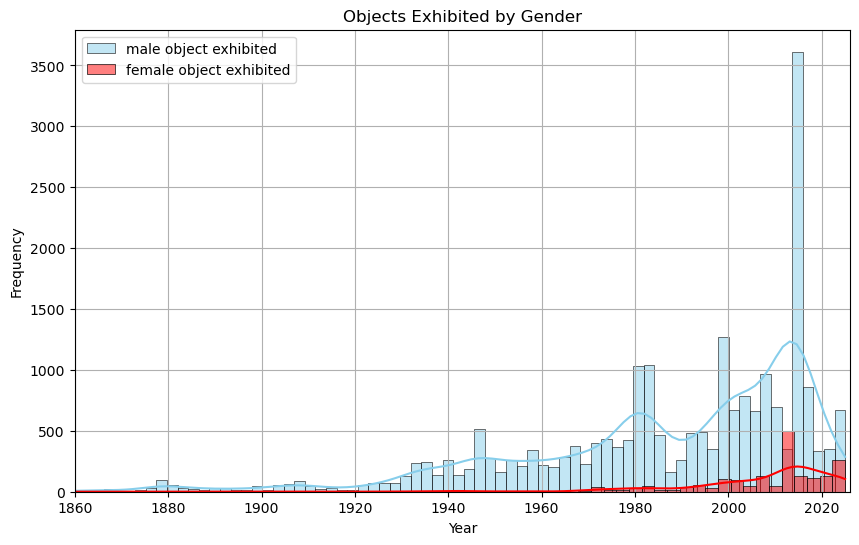

In [26]:

df_list = []
data = exhibited_df.exhibitions.values

for json_string in data:
    if pd.isna(json_string):
        df_list.append(None)
    else:
        try:
            # First try direct JSON parsing
            parsed_data = json.loads(json_string)
        except json.JSONDecodeError:
            try:
                # Try fixing common issues
                json_string_fixed = json_string.replace("'", '"')
                parsed_data = json.loads(json_string_fixed)
            except json.JSONDecodeError:
                try:
                    # Last resort - use ast.literal_eval for Python-like syntax
                    parsed_data = ast.literal_eval(json_string)
                except (ValueError, SyntaxError) as e:
                    print(f"Failed to parse: {json_string}")
                    print(f"Error: {str(e)}")
                    parsed_data = None
        
        if parsed_data is not None:
            try:
                normalized_df = pd.json_normalize(parsed_data)
                df_list.append(normalized_df)
            except Exception as e:
                print(f"Normalization failed for: {parsed_data}")
                print(f"Error: {str(e)}")
                df_list.append(None)
        else:
            df_list.append(None)

# Store results
exhibited_df['exhibitions_df'] = df_list

exhibited_df['exhibitions_df'][:3]
exhibited_df.loc[:,'exhibitions_date'] = exhibited_df.exhibitions_df.apply(lambda x: list(x['begindate']) if isinstance(x, pd.DataFrame) and 'begindate' in x.columns else [])

m_exhibited = exhibited_df[exhibited_df['male/female'] == 'male']
f_exhibited = exhibited_df[exhibited_df['male/female'] == 'female']
u_exhibited = exhibited_df[exhibited_df['male/female'] == 'unknown']
m_list = []
f_list = []
u_list = []
from itertools import chain

m_list.append([i[:] for i in m_exhibited['exhibitions_date'].values])
m_list_flattened = list(chain.from_iterable(chain.from_iterable(m_list)))
m_list_flattened = pd.to_datetime(m_list_flattened, format='ISO8601').year.tolist()
f_list.append(i for i in f_exhibited['exhibitions_date'].values[:])
f_list_flattened = list(chain.from_iterable(chain.from_iterable(f_list)))
f_list_flattened = pd.to_datetime(f_list_flattened, format='ISO8601').year.tolist()
u_list.append(i for i in u_exhibited['exhibitions_date'].values[:])
u_list_flattened = list(chain.from_iterable(chain.from_iterable(u_list)))
u_list_flattened = pd.to_datetime(u_list_flattened, format='ISO8601').year.tolist()




plt.figure(figsize=(10, 6))


sns.histplot(m_list_flattened , kde=True, color = 'skyblue', label = "male object exhibited", bins = 130)
sns.histplot(f_list_flattened , kde=True, color="red", label = "female object exhibited")
#sns.histplot(u_list_flattened , kde=True, color="yellow", label = "unknown gender object exhibited")


plt.title('Objects Exhibited by Gender')
plt.xlim(1860, 2026)
#plt.ylim(0, 4500)
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


## We also looked at trends in Exhibitions and Acquisitions 

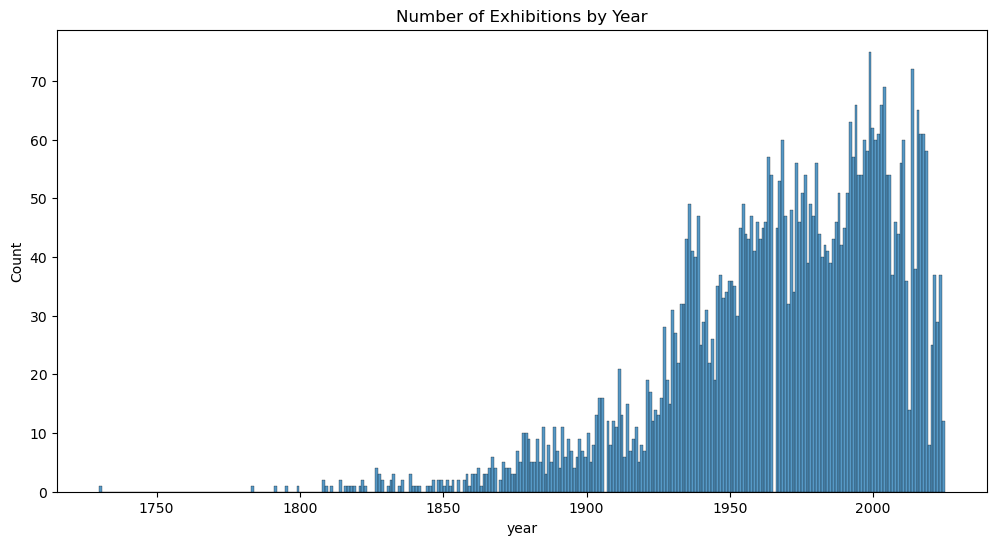

In [8]:
e_df = pd.read_csv('exhibitions.csv')
e_df['begindate'] = pd.to_datetime(e_df['begindate'], errors = 'coerce')
e_df['year'] = e_df['begindate'].dt.year

plt.figure(figsize=(12, 6))
plt.title("Number of Exhibitions by Year")
sns.histplot(e_df['year'], bins = 300)
plt.show()

## Looking at exhibition curators
### We see 93% of exhibitions do not have a curator listed.

93.0 % of exhibitions do not have a curator listed.


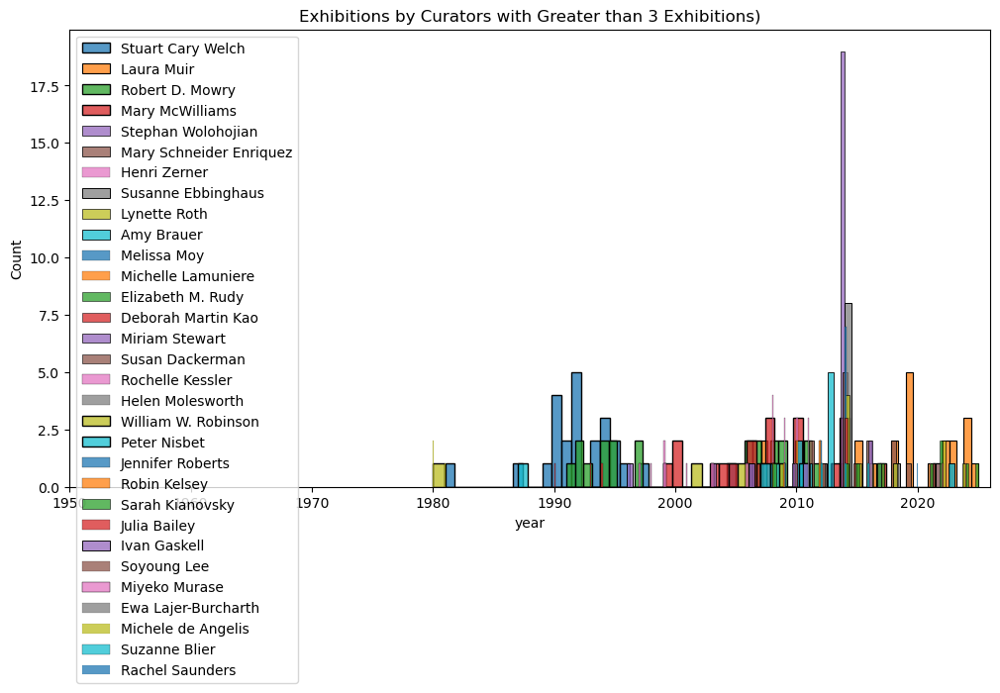

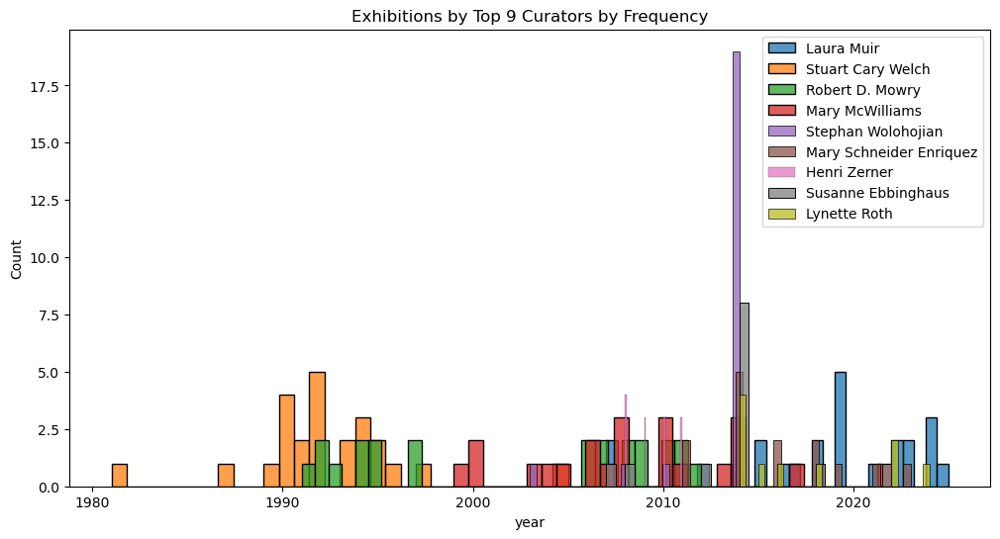

In [9]:
def extract_from_json(people_entry):
    try:
        if isinstance(people_entry, str):
            data = ast.literal_eval(people_entry)
            return next((item['name'] for item in data if 'name' in item), None)
        elif isinstance(people_entry, list):
            return next((item['name'] for item in people_entry if 'name' in item), None)
    except:
        return None

e_df['name'] = e_df['people'].apply(extract_from_json)

print(f"{round( e_df ['people'].isna().sum()/ e_df.shape[0], 2) *100} % of exhibitions do not have a curator listed.")

name_list = e_df['name'].value_counts()[(e_df['name'].value_counts()>=3)].index
list(name_list)
plt.figure(figsize=(12, 6))
for name in name_list:
    if name != None:
        j = e_df[e_df['name'] == name]['year']
        sns.histplot(j, label= name, bins = 30)
plt.xlim(1950, 2026)
plt.title("Exhibitions by Curators with Greater than 3 Exhibitions)")
plt.legend()
plt.show

Laura = e_df[e_df['name'] == 'Laura Muir']['year']
Stuart = e_df[e_df['name'] == 'Stuart Cary Welch']['year']
Robert = e_df[e_df['name'] == 'Robert D. Mowry']['year']
Mary = e_df[e_df['name'] == 'Mary McWilliams']['year']
Stephan = e_df[e_df['name'] == 'Stephan Wolohojian']['year']
Mary2 = e_df[e_df['name'] == 'Mary Schneider Enriquez']['year']
Henri = e_df[e_df['name'] == 'Henri Zerner']['year']
Susan = e_df[e_df['name'] == 'Susanne Ebbinghaus']['year']
Lyne = e_df[e_df['name'] == 'Lynette Roth']['year']
Amy = e_df[e_df['name'] == 'Amy Brauer  ']['year']
Mary2 = e_df[e_df['name'] == 'Mary Schneider Enriquez']['year']
Henri = e_df[e_df['name'] == 'Henri Zerner']['year']
Susan = e_df[e_df['name'] == 'Susanne Ebbinghaus']['year']
Lyne = e_df[e_df['name'] == 'Lynette Roth']['year']
Amy = e_df[e_df['name'] == 'Amy Brauer  ']['year']


plt.figure(figsize=(12, 6))
sns.histplot(Laura, label= "Laura Muir", bins = 30)
sns.histplot(Stuart, label= 'Stuart Cary Welch', bins = 30)
sns.histplot(Robert, label= 'Robert D. Mowry', bins = 30)
sns.histplot(Mary, label= 'Mary McWilliams', bins = 30)
sns.histplot(Stephan, label= 'Stephan Wolohojian', bins = 30)
sns.histplot(Mary2, label= 'Mary Schneider Enriquez', bins = 30)
sns.histplot(Henri, label= 'Henri Zerner', bins = 30)
sns.histplot(Susan, label= 'Susanne Ebbinghaus', bins = 30)
sns.histplot(Lyne, label= 'Lynette Roth', bins = 30)
sns.histplot(Amy, label= 'Amy Brauer  ', bins = 30)
#sns.histplot(Henri, label= 'Henri Zerner', bins = 30)
#sns.histplot(Susan, label= 'Susanne Ebbinghaus', bins = 30)
#sns.histplot(Lyne, label= 'Lynette Roth', bins = 30)
#sns.histplot(Amy, label= 'Amy Brauer  ', bins = 30)
plt.title("Exhibitions by Top 9 Curators by Frequency")
plt.legend()
plt.show()

## Now we can see each major curator alongside of the tiles and years of the shows that they put on.

In [10]:
for person in name_list:
    shows= e_df[e_df['name'] == person][['title', 'year']]
    print(person)
    display(shows)

Stuart Cary Welch


,title,year
18,"From Mind, Heart, and Hand: Persian, Turkish, and Indian Drawings from SCWelch",2005.0
46,The Ottomans: Images from East and West,1989.0
218,Arabesque,1990.0
432,"Eyes to the East: Indian, Persian, and Turkish Art Given by Harvard Graduates",1990.0
443,Five Masters of Persian and Indian Painting,1992.0
480,"From India's Hills and Plains: Rajput Painting from the Punjab and Rajasthan, 17th through 19th Centuries",1993.0
496,"Gods, Thrones, and Peacocks - Revisited: Northern Indian Miniatures from two Traditions, Fifteenth to Nineteenth Centuries",1990.0
521,Hot as Curry - Subtle as Moonlight: Masterpieces of Rajput Painting,1991.0
601,"Linear Graces ... and Disgraces: Part I, Drawings from the Courts of Persia, Turkey, and India, 15th-19th Centuries",1994.0
602,"Linear Graces ... and Disgraces: Part II, Drawings from the Courts of Persia, Turkey, and India, 15th-19th Centuries",1994.0


Laura Muir


,title,year
19,HAA 1 Survey Course: Landmarks of World Art and Architecture [Spring 2007],2007.0
90,32Q: 1520 Art in Germany Between the Wars (Interwar and Bauhaus),2014.0
3093,"Paintings by Max Beckmann from the Pinakothek der Moderne, Munich",2007.0
3169,"Lyonel Feininger: Photographs, 1928-1939",2011.0
3382,"Recent Acquisitions, Part I: Contemporary Photographs",2012.0
3730,"European and American Pop Art, 1955-1975",2015.0
3745,A History of Photography,2015.0
3867,Modern Art and Modernity,2016.0
4059,What about Revolution? Aesthetic Practices after 1917,2017.0
4101,Looking Back: The Western Tradition in Retrospect,2018.0


Robert D. Mowry


,title,year
32,Paragons of Wisdom and Virtue: East Asian Figure Painting,1997.0
33,"Rocks, Mountains, Landscapes, and Gardens: The Essence of East Asian Painting (1997)",1997.0
34,"Art of the Fan: China, Korea, Japan",1995.0
35,Asian Art: Recent Acquisitions,1995.0
36,Women and the Arts of Asia,1994.0
37,East Asia in the Nineteenth Century,1994.0
38,The Arts of Korea,1992.0
39,Chinese and Japanese Painting of the Early Modern Era,1993.0
40,Later Chinese and Japanese Figure Painting in Decorative Arts,1992.0
41,Chinese Painting and Decorative Arts from the Permanent Collection,1991.0


Mary McWilliams


,title,year
96,32Q: 2550 Islamic,2014.0
97,32Q: 2590 South and Southeast Asia,2014.0
2568,The Enlightened Eye: Gifts from John Goelet,2000.0
2572,Courts and Countryside: Islamic Paintings from the 14th through the 17th Century,1999.0
2638,The Continuous Stroke of a Breath: Calligraphy from the Islamic World,2003.0
2858,The Sport of Kings: Art of the Hunt in Iran and India,2005.0
2874,The Tablet and the Pen: Drawings from the Islamic World,2006.0
2916,"Closely Focused, Intensely Felt: Selections from the Norma Jean Calderwood Collection of Islamic Art",2004.0
3044,"Overlapping Realms: Arts of the Islamic World and India, 900-1900",2006.0
3118,"On the Path of Madness: Representations of Majnun in Persian, Turkish, and Indian Painting",2007.0


Stephan Wolohojian


,title,year
21,Re-View: S422-423 Western Art of the Middle Ages & Renaissance,2008.0
63,32Q: 1220 Wertheim,2014.0
65,32Q: 2710 North Arcade,2014.0
66,32Q: 2700 Impressionism,2014.0
67,32Q: 2460 East Arcade,2014.0
68,32Q: 2440 Medieval,2014.0
69,32Q: 2410 South Arcade,2014.0
70,32Q: 2400 French/Italian/Spanish,2014.0
71,32Q: 2340 Cabinet Gallery,2014.0
72,32Q: 2300 Dutch & Flemish,2014.0


Mary Schneider Enriquez


,title,year
51,Re-View: S118 Paper Rotation 1 (Sept 2011),2011.0
80,32Q: 1100,2014.0
82,32Q: 1120 Contemporary Art,2014.0
83,32Q: 1200 Gesture,2014.0
85,32Q: 1310 Surrealism,2014.0
3317,Re-View: European and American Art Since 1900,2011.0
3715,Everywhen: The Eternal Present in Indigenous Art from Australia,2016.0
3841,Doris Salcedo: The Materiality of Mourning,2016.0
4220,"Crossing Lines, Constructing Home: Displacement and Belonging in Contemporary Art",2019.0
4430,Krzysztof Wodiczko: Portrait,2021.0


Henri Zerner


,title,year
26,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 08 Rotation 1),2008.0
27,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 08 Rotation 3),2008.0
3127,"HAA 10 Survey Course: The Western Tradition, Art Since the Renaissance",2008.0
3203,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 08 Rotation 2),2008.0
3216,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 09 Rotation 1),2009.0
3217,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 09 Rotation 2),2009.0
3218,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 09 Rotation 3),2009.0
3257,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 10 Rotation 1),2010.0
3300,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 10 Rotation 2),2010.0
3301,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 10 Rotation 3),2010.0


Susanne Ebbinghaus


,title,year
53,32Q: 3740 Egyptian,2014.0
54,32Q: 3460 East Arcade,2014.0
55,32Q: 3400 Greek,2014.0
56,32Q: 3710 North Arcade,2014.0
57,32Q: 3200 West Arcade,2014.0
58,32Q: 3410 South Arcade,2014.0
59,32Q: 3700 Roman,2014.0
60,32Q: 3440 Middle East,2014.0
3071,Gods in Color: Painted Sculpture of Classical Antiquity,2007.0
3147,Re-View: S422 Ancient & Byzantine Art & Numismatics,2008.0


Lynette Roth


,title,year
64,"32Q: 1440 Secessionism: Munich, Vienna, Berlin (Expressionism)",2014.0
88,32Q: 1500 Art in Germany Between the Wars (Expressionism-Interwar),2014.0
89,32Q: 1510 German Expressionist Sculpture,2014.0
3708,Rebecca Horn: “Work in Progress”,2014.0
3842,Private Practice,2015.0
3939,"Inventur—Art in Germany, 1943–55",2018.0
4434,Disrupt the View: Arlene Shechet at the Harvard Art Museums,2022.0
4600,"Folding, Refraction, Touch: Modern and Contemporary Art in Dialogue with Wolfgang Tillmans",2016.0
4607,White Shadows: Anneliese Hager and the Camera-less Photograph,2022.0
4970,Made in Germany? Art and Identity in a Global Nation,2024.0


Amy Brauer


,title,year
3254,Re-View: S426A (Large Niche) #1: The Past and the Present: British Art of the 19th Century,2010.0
3290,Re-View: S426A (Large Niche) #2: The Past and the Present: British Art of the 19th Century,2010.0
3320,"HAA 176m Berlin and Moscow, 1918/1930 Rotation #1 (S421) Spring 2011",2011.0
3563,Strategies of Exhibition Design in the Twentieth Century: History and Theory,2013.0
3564,Word and Image in Persian Painting,2013.0
3565,The Art of Looking,2013.0
3566,Civil War Project,2013.0
3567,"Boston Taste, 1670 - 1970",2013.0
4468,A World Within Reach: Greek and Roman Art from the Loeb Collection,2023.0


Melissa Moy


,title,year
61,32Q: 1740 Early China I,2014.0
62,32Q: 2740 Buddhist II,2014.0
94,32Q: 1600 Early China II,2014.0
95,32Q: 1610 Buddhist Art I,2014.0
98,32Q: 2620 Winter Garden,2014.0
99,"32Q: 2600 East Asian, Japanese, Chinese and Korean",2014.0
100,32Q: 1006 East Arcade,2014.0
3937,Adorning the Inner Court: Jun Ware for the Chinese Palace,2017.0


Michelle Lamuniere


,title,year
3195,Re-View: S231 (Islamic rotation: 2) Sacred Sites: Nineteenth Century Photographs of Jerusalem,2009.0
3251,Re-View: S426A (Large Niche) HAA175w Pop Art,2010.0
3253,"Around Antique: Prints, Drawings, and Photographs (Teaching Gallery) S421",2010.0
3463,Laurel Nakadate: Say You Love Me,2011.0
3466,"Recent Acquisitions, Part II: Building the Collection",2012.0
4596,"Recent Acquisitions, Part III: Kerry James Marshall",2012.0


Elizabeth M. Rudy


,title,year
3781,Drawing: The Invention of a Modern Medium,2017.0
4311,Dare to Know: Prints and Drawings in the Age of Enlightenment,2022.0
4510,LaToya M. Hobbs: It’s Time,2024.0
4605,States of Play: Prints from Rembrandt to Delsarte,2021.0
4608,Prints from the Brandywine Workshop and Archives: Creative Communities,2022.0
4972,Edvard Munch: Technically Speaking,2025.0


Deborah Martin Kao


,title,year
81,32Q: 1110,2014.0
86,32Q: 1320 Social Realism,2014.0
87,32Q: 1330,2014.0
3054,"Classified Documents: The Social Museum of Harvard University, 1903-1931",2007.0
3738,Jesse Aron Green: Ärztliche Zimmergymnastik,2015.0


Miriam Stewart


,title,year
48,Re-View: S425A (Small Niche) Peter Blume,2010.0
3029,Under Cover: Artists' Sketchbooks,2006.0
3741,Body Image in French Art and Visual Culture (18th and 19th Centuries),2016.0
3758,"Drawings from the Age of Bruegel, Rubens, and Rembrandt",2016.0
4073,"The Art of Drawing in the Early Dutch Golden Age, 1590–1630: Selected Works from the Abrams Collection",2017.0


Susan Dackerman


,title,year
3034,DISSENT!,2006.0
3101,"Kara Walker: ""Harper's Pictorial History of the Civil War (Annotated)""",2007.0
4593,Prints and the Pursuit of Knowledge in Early Modern Europe,2011.0
4595,Jasper Johns / In Press: The Crosshatch Works and the Logic of Print,2012.0
4598,Corita Kent and the Language of Pop,2015.0


Rochelle Kessler


,title,year
1832,"Rasika, the Discerning Connoisseur: Indian Paintings from the John Kenneth Galbraith Collection",1998.0
1866,"Shadows of God On Earth: Arts of the Ottoman, Safavid, and Mughal Dynasties",1997.0
1933,Divinely Inspired: Images of Mystics and Mendicants,1999.0
2331,The Sensuous and the Sublime: Representations of Love in the Arts of the Middle East and Southern Asia,2001.0
2571,A Grand Legacy: Arts of the Ottoman Empire,1999.0


Helen Molesworth


,title,year
47,Re-View: S425A (Small Niche) New Acquisition: Lorna Simpson,2010.0
3092,Contemporary Art from the Harvard University Art Museums Collections,2007.0
3112,Long Life Cool White: Photographs by Moyra Davey,2008.0
3220,"ACT UP New York: Activism, Art and the AIDS Crisis, 1987-1993",2009.0


William W. Robinson


,title,year
22,Re-View: S426A (Large Niche) 19th Century French Portrait Drawings,2009.0
2494,Bruegel to Rembrandt: Dutch and Flemish Drawings from the Maida and George Abrams Collection,2002.0
3032,Rembrandt and the Aesthetics of Technique,2006.0
3181,The Draughtsman at Work. Drawing in the Golden Century of Dutch Art,1980.0


Peter Nisbet


,title,year
3105,Light Display Machines: Two Works by László Moholy-Nagy,2007.0
3153,Re-View: S118 European & American Art since 1900,2008.0
3168,Lyonel Feininger: Drawings and Watercolors from the William S. Lieberman Bequest to the Busch-Reisinger Museum,2011.0
4254,El Lissitzky 1890-1941,1987.0


Jennifer Roberts


,title,year
31,Re-View: S426A (Large Niche) #2: CB30 Photography and Society & HAA172w American Art and Modernity,2009.0
52,"GenEd US12 American Encounters: Art, Contact, and Conflict, 1560-1860 (S427) Spring 2012",2012.0
3519,"American Art and Modernity, 1865–1965",2012.0
3562,Modern Art and Modernity,2013.0


Robin Kelsey


,title,year
28,Re-View: S426A (Large Niche) HAA Lit & Arts B24,2008.0
30,Re-View: S426A (Large Niche) #1: CB30 Photography and Society & HAA172w American Art and Modernity,2009.0
3446,HAA178m Cold War Photography (S427) Spring 2012,2012.0
3518,Seeing Is Believing: A History of Photography,2012.0


Sarah Kianovsky


,title,year
84,32Q: 1300 Early Modernism,2014.0
3150,Re-View: S427 Impressionist & Postimpressionist Art,2008.0
3717,The Dorothy and Herbert Vogel Collection: Fifty Works for Fifty States,2015.0
4601,"Reverie: Christopher Wilmarth, Before and After Mallarmé",2017.0


Julia Bailey


,title,year
309,Colors of the Caucasus,1990.0
363,Earthly Paradise: Gardens in Islamic Art,1993.0
768,Pattern and Purpose. Decorative Arts of Islam.,1994.0


Ivan Gaskell


,title,year
3030,"""A Public Patriotic Museum"": Artworks and Artifacts from the General Artemas Ward House",2006.0
3313,Tangible Things,2011.0
4388,Investigating the Renaissance,1996.0


Soyoung Lee


,title,year
103,Recent Acquisitions 2020,2021.0
4462,"Earthly Delights: 6,000 Years of Asian Ceramics",2022.0
4557,Future Minded: New Works in the Collection,2024.0


Miyeko Murase


,title,year
3490,Flowing Streams and Rivers in Japanese Life,2006.0
3495,Great Waves: Chinese Themes in the Arts of Korea and Japan,2003.0
3514,Through the Seasons: Japanese Art in Nature,1999.0


Ewa Lajer-Burcharth


,title,year
3208,Re-View: S426A (Large Niche) HAA171x Exoticism and Orientalism,2009.0
3318,"HAA 271x The Origins of Modernity: The ""New"" 18th Century Rotation #1: Large Niche (S426A) Spring 2011",2011.0
3319,"HAA 271x The Origins of Modernity: The ""New"" 18th Century Rotation #2: Large Niche (S426A) Spring 2011",2011.0


Michele de Angelis


,title,year
42,Sacred Symbols of Islam,1980.0
43,The Hofer Bequest and Islamic Decorative Arts from the Fogg Collection,1980.0
44,Architectural Themes in the Arts of Islam,1981.0


Suzanne Blier


,title,year
3520,Landmarks of World Art and Architecture,2012.0
3623,World’s Fairs,2014.0
3747,Art of Jazz: Form,2016.0


Rachel Saunders


,title,year
4170,Prince Shōtoku: The Secrets Within,2019.0
4197,Japan on Paper,2019.0
4606,Painting Edo: Japanese Art from the Feinberg Collection,2020.0


## Trends in culture and divisions of objects acquired.

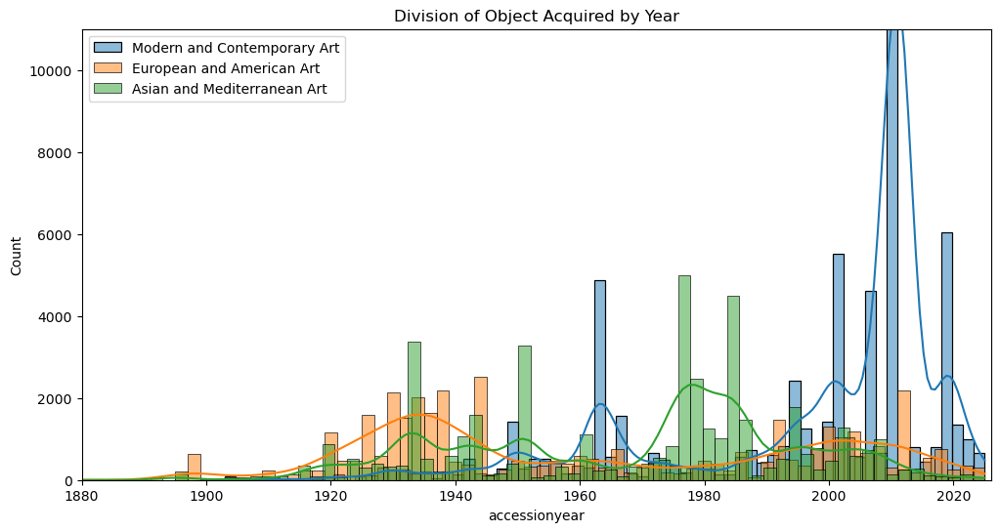

In [11]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df[df['division']== 'Modern and Contemporary Art'], x='accessionyear', kde=True, label = 'Modern and Contemporary Art', bins = 70)
sns.histplot(data=df[df['division']== 'European and American Art'], x='accessionyear', kde=True, label = 'European and American Art', bins = 130)
sns.histplot(data=df[df['division']== 'Asian and Mediterranean Art'], x='accessionyear', kde=True, label = 'Asian and Mediterranean Art', bins = 100)
plt.title("Division of Object Acquired by Year")
plt.ylim(0,11000)
plt.xlim(1880,2026)
plt.legend()
plt.show()

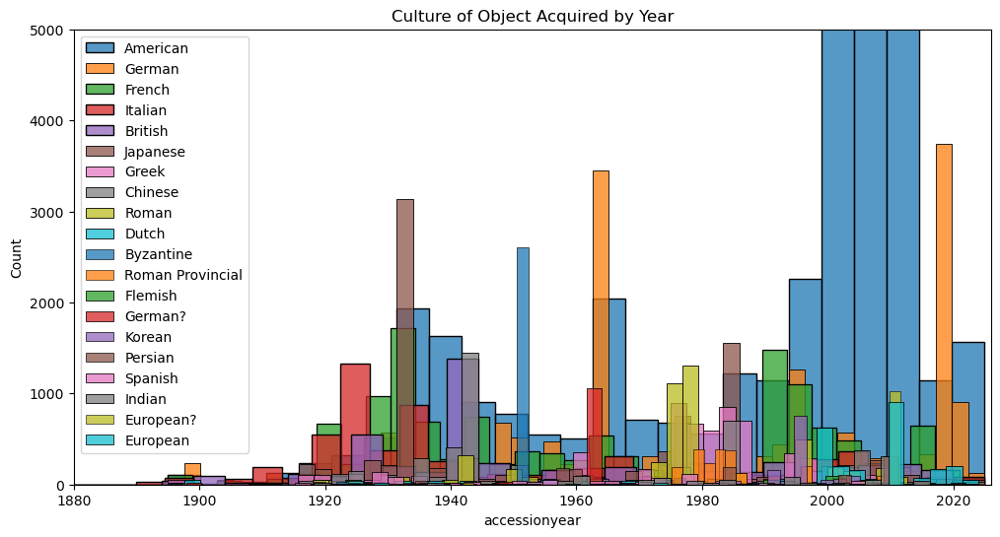

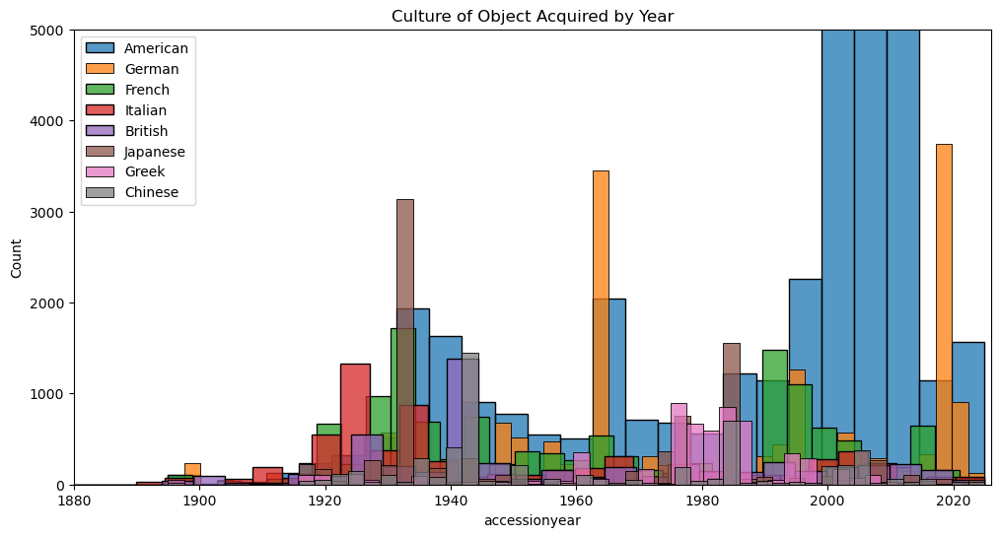

In [12]:
top_20 = df['culture'].value_counts()[:20].index
plt.figure(figsize=(12, 6))
for cult in top_20: 
    sns.histplot(data=df[df['culture']== cult], x='accessionyear', label = cult, bins = 50)
plt.title("Culture of Object Acquired by Year")
plt.ylim(0,5000)
plt.xlim(1880,2026)
plt.legend()
plt.show()

top_8 = df['culture'].value_counts()[:8].index
plt.figure(figsize=(12, 6))
for cult in top_8: 
    sns.histplot(data=df[df['culture']== cult], x='accessionyear', label = cult, bins= 50)
plt.title("Culture of Object Acquired by Year")
plt.ylim(0,5000)
plt.xlim(1880,2026)
plt.legend()
plt.show()

## Now we will try to group exhibitions by descriptions and titles to better understand trends

5.0% of exhibitions have a description.


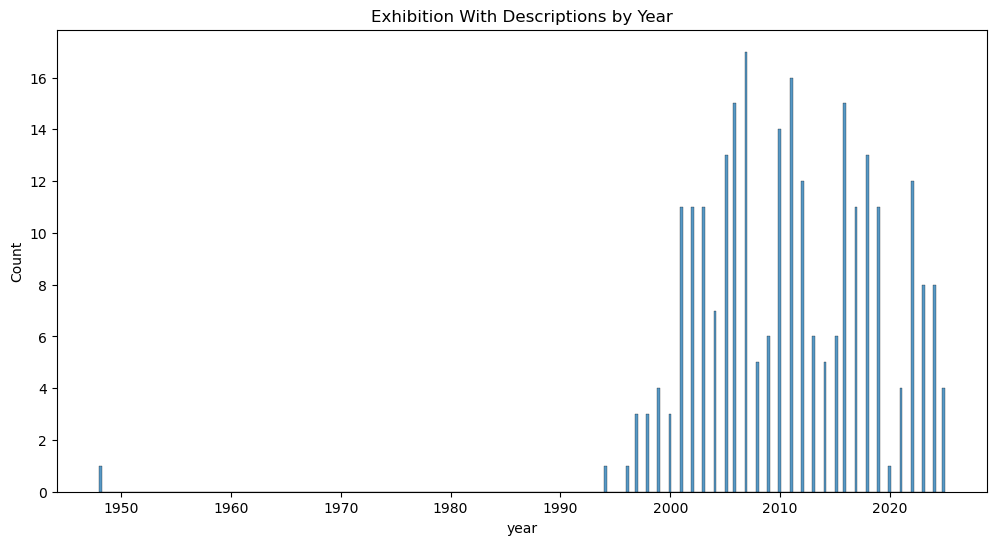

In [13]:
des_df = e_df[~e_df['description'].isna()]

print(f"{round(des_df.shape[0]/e_df.shape[0], 2) *100}% of exhibitions have a description.")
des_df['begindate'] = pd.to_datetime(des_df['begindate'])
des_df['year'] = des_df['begindate'].dt.year
plt.figure(figsize=(12, 6))
plt.title("Exhibition With Descriptions by Year")
sns.histplot(des_df['year'], bins = 300)
plt.show()

## Creating Word Clouds

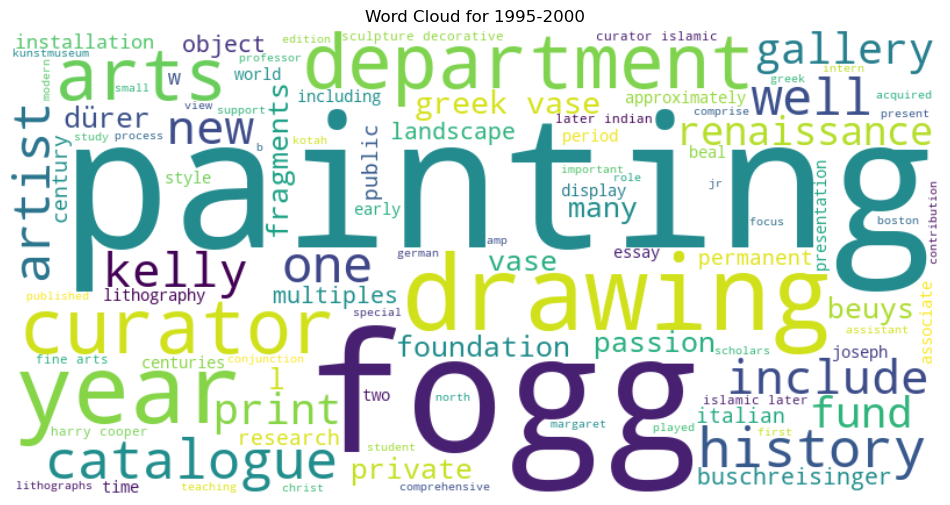

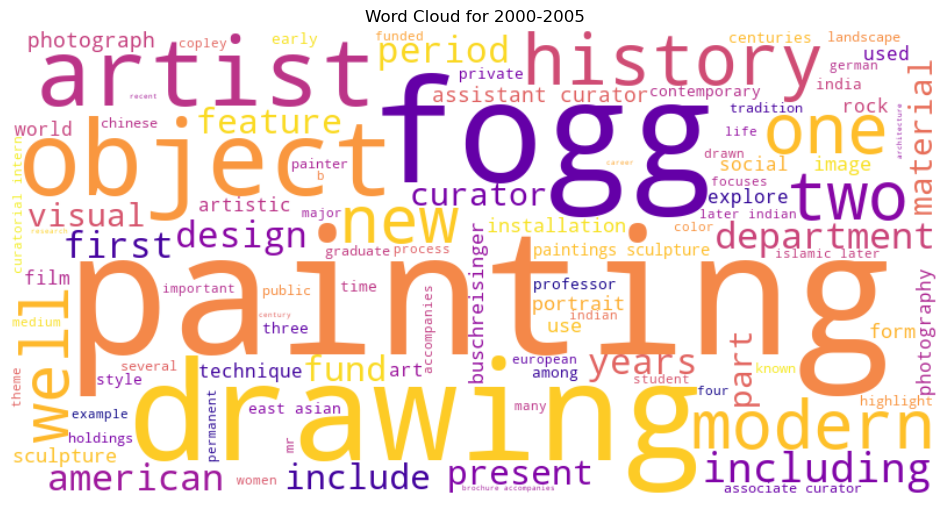

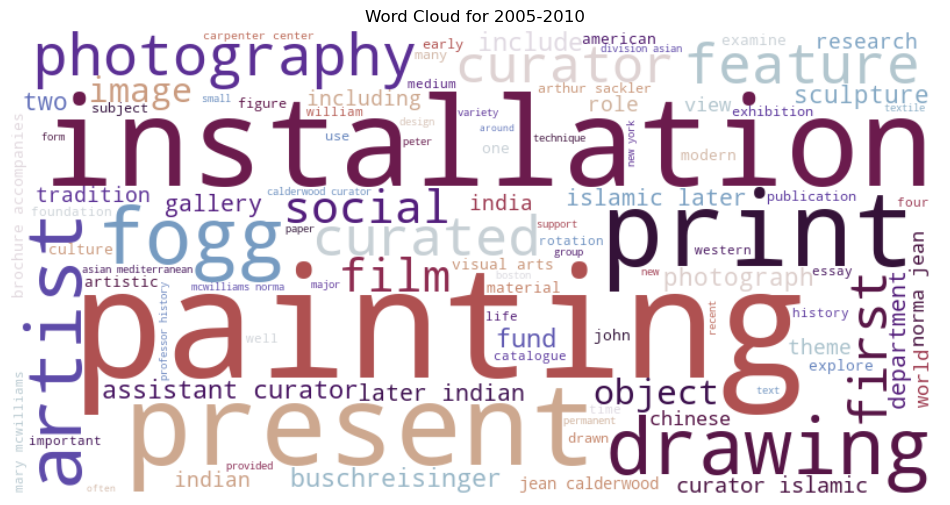

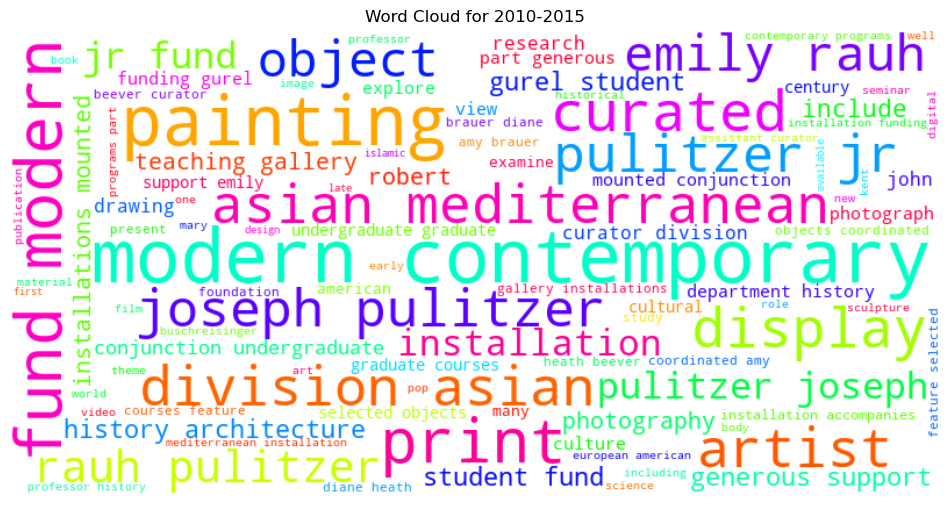

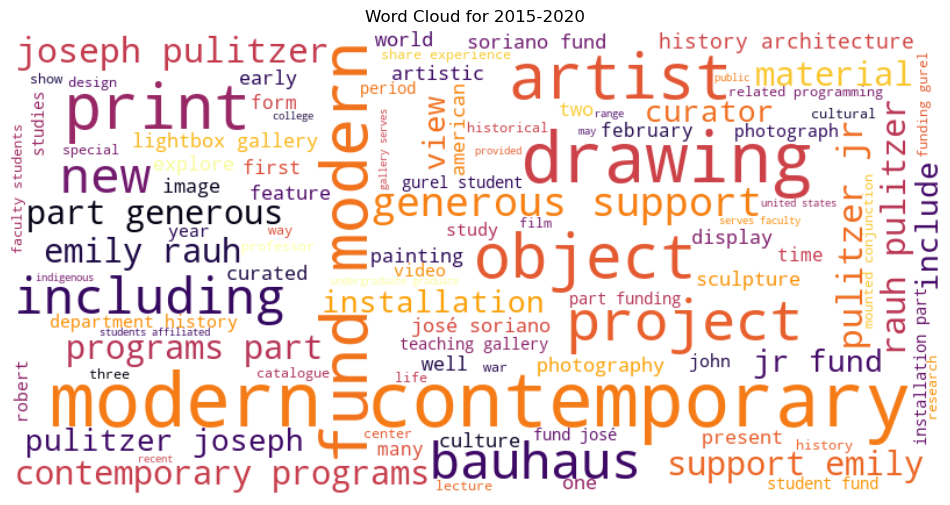

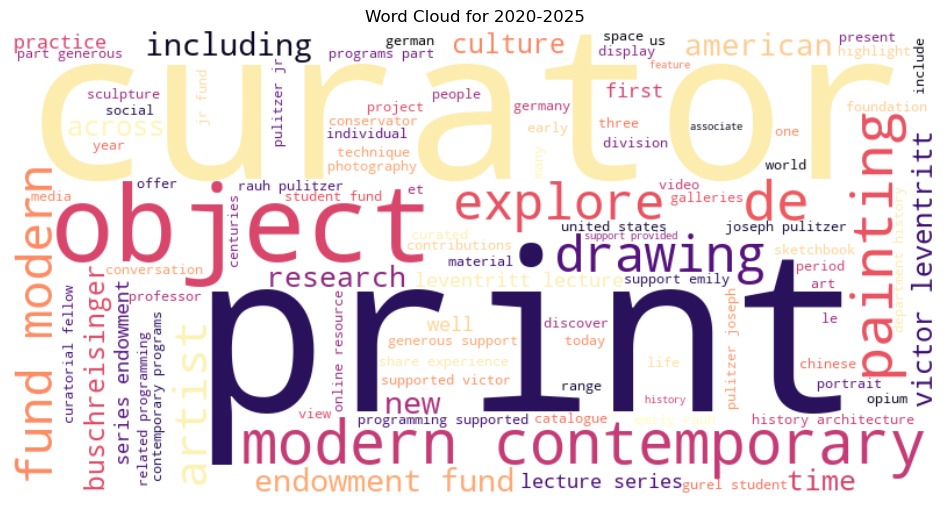

In [14]:
small_remove_words = set(['exhibition', 'harvard', 'art', 'work', 'university', 'museum',
'artists', 'museums', 'collection', 'works'])
remove_museum_words = set(['exhibition', 'harvard', 'art', 'work', 'university', 'museum',
'artists', 'museums', 'collection', 'works', 'organized', 'possible', 'made', 
                          'collections'])

colors = ['viridis', 'plasma', 'twilight_shifted', 'hsv','inferno', 'magma', 'cividis']
def print_wordclouds(df, remove):
    dft = {}
    for i in range(0, 30, 5):
       
        
        temp_df = df[(df['year'] >= (1995 + i)) & (df['year'] <= (2000 + i))]
        
        text = ' '.join(temp_df['description'].astype(str))
        text = text.lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        
        stop_words = set(stopwords.words('english'))
        stop_words = stop_words.union(remove)  
        word_tokens = word_tokenize(text)
        filtered_text = [word for word in word_tokens if word not in stop_words]
        
        clean_text = ' '.join(filtered_text)
        
        wordcloud = WordCloud(
            width=800, 
            height=400,
            background_color='white',
            max_words=100,
             colormap= colors[int(i/5)]
        ).generate(clean_text)
        
        plt.figure(figsize=(12, 8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {1995+i}-{2000+i}')  # Added title for clarity
        plt.axis('off')
        plt.show()
        
        dft[f'des_{1995+i}'] = clean_text
    
    return dft
#dft = print_wordclouds(des_df, small_remove_words)
dft = print_wordclouds(des_df, remove_museum_words)

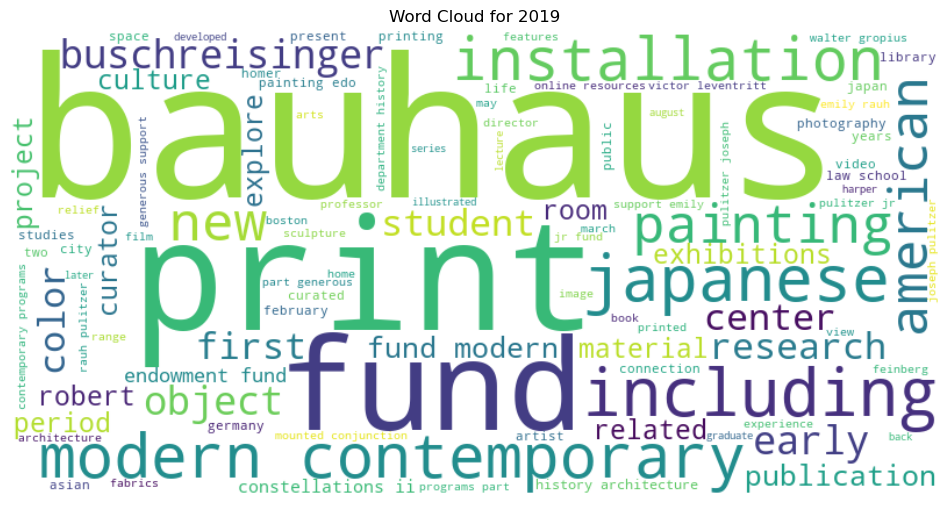

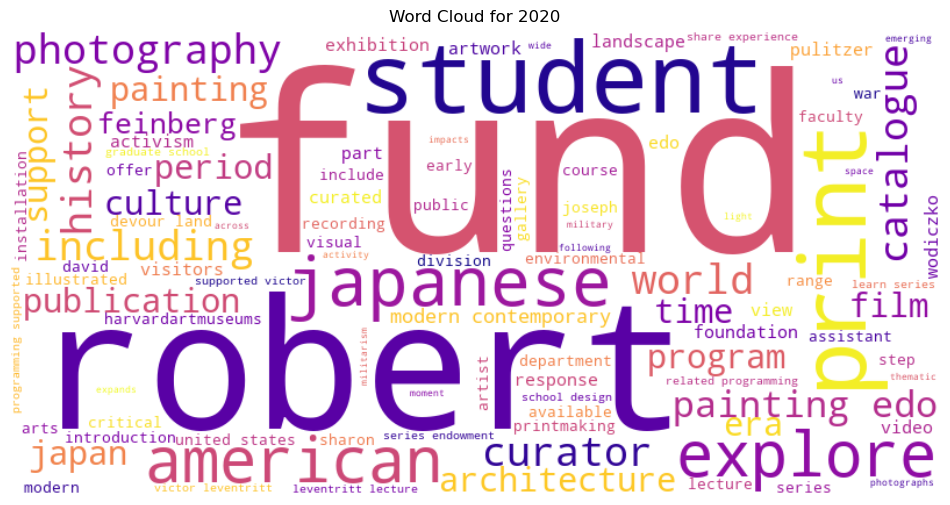

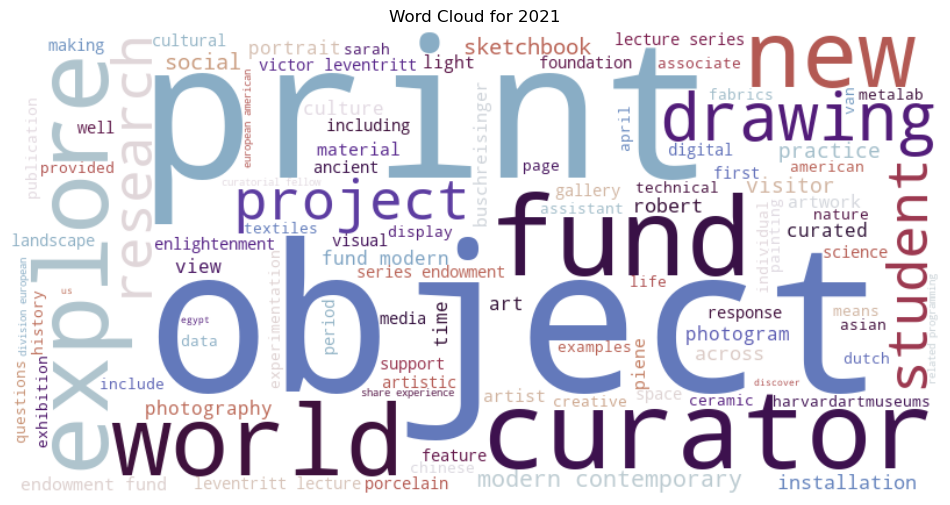

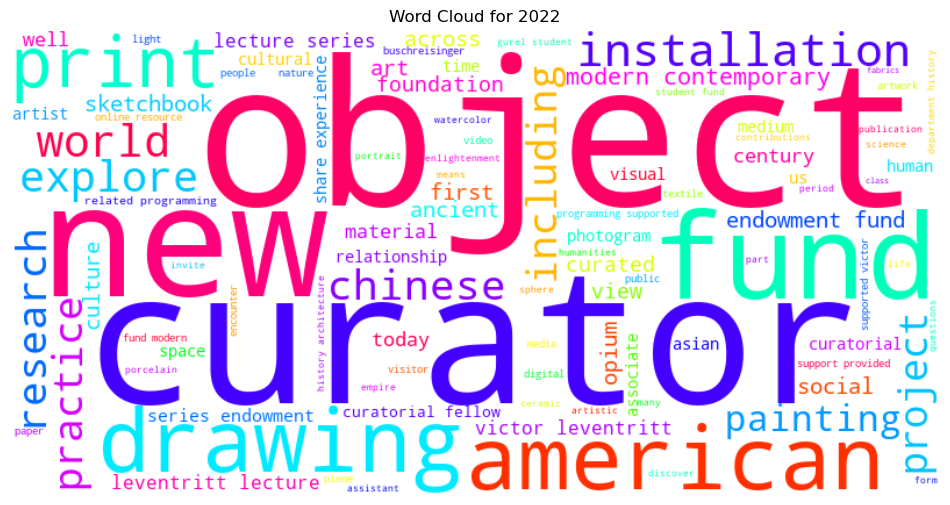

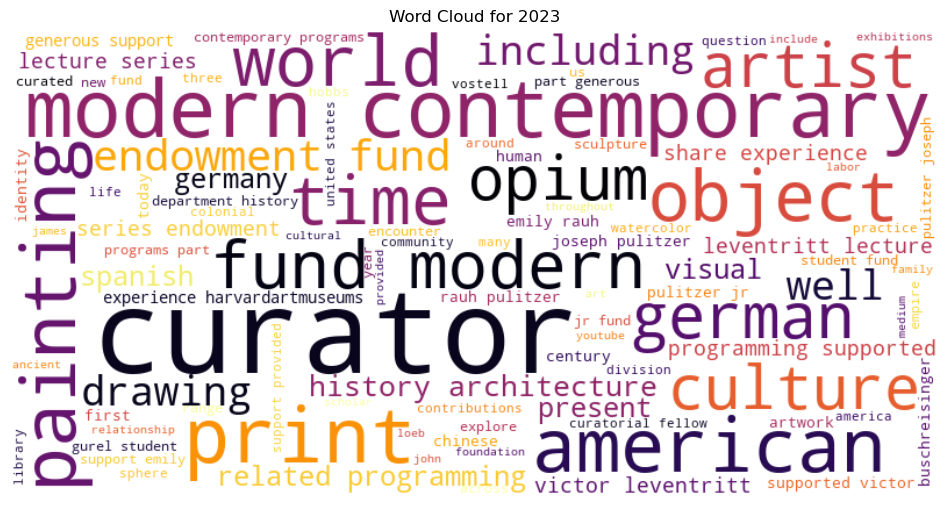

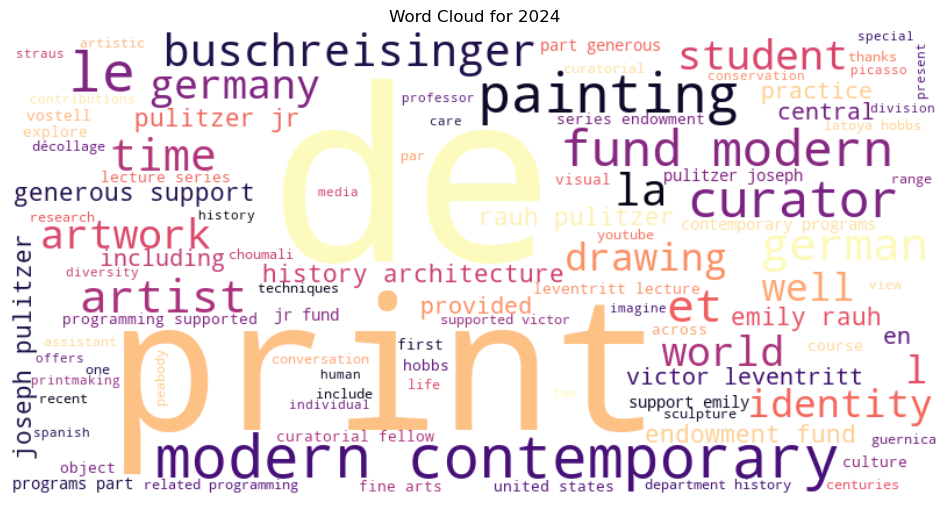

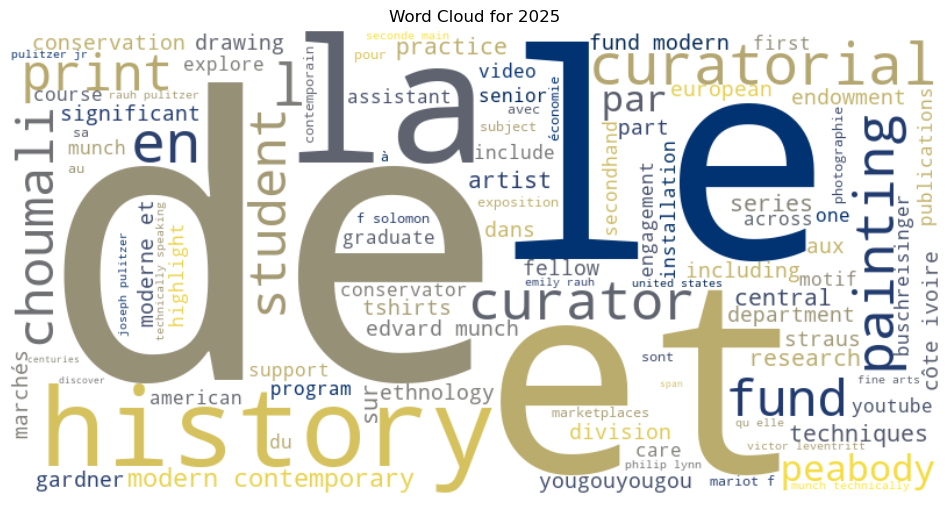

In [15]:

def print_wordclouds(df, remove):
    dft = {}
    for i in range(0,7, 1):
       
        
        temp_df = df[(df['year'] >= (2019 + i)) & (df['year'] <= (2020 + i))]
        
        text = ' '.join(temp_df['description'].astype(str))
        text = text.lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        
        stop_words = set(stopwords.words('english'))
        stop_words = stop_words.union(remove)  
        word_tokens = word_tokenize(text)
        filtered_text = [word for word in word_tokens if word not in stop_words]
        
        clean_text = ' '.join(filtered_text)
        
        wordcloud = WordCloud(
            width=800, 
            height=400,
            background_color='white',
            max_words=100,
            colormap= colors[i]
        ).generate(clean_text)
        
        plt.figure(figsize=(12, 8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {2019+i}')  # Added title for clarity
        plt.axis('off')
        plt.show()
        
        dft[f'des_{2019+i}'] = clean_text
    
    return dft
#dft = print_wordclouds(des_df, small_remove_words)
dft = print_wordclouds(des_df, remove_museum_words)

## Clustering Exhibition Descriptions
using tfidf

0.043813635974762045


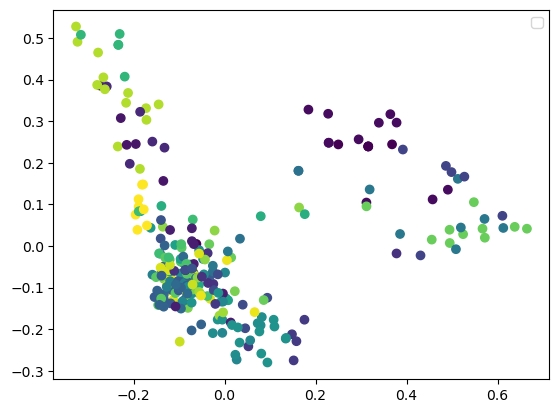

Top terms per cluster:
Cluster 0:
2011, third, second, november, installation, october, feature selected, gallery installations, installation accompanies, courses feature
Cluster 1:
installation, objects coordinated, beever curator, coordinated amy, heath beever, heath, diane heath, brauer diane, course, amy brauer
Cluster 2:
calderwood, norma jean, norma, jean calderwood, islamic, jean, fabrics, mcwilliams, mary mcwilliams, mary
Cluster 3:
ancient, roman, vessels, portraits, greek, objects, munch, rothko, research, conservation
Cluster 4:
indian, islamic, india, islamic later, later indian, later, local, colonial, installation, period
Cluster 5:
design, school design, school, graduate school, modern, le, building, et, graduate, de
Cluster 6:
contemporary, modern contemporary, modern, body, wilmarth, pulitzer, fund modern, installation, installed, artist
Cluster 7:
students, artwork, course, humanities, analysis, faculty, architecture, world, visual, critical
Cluster 8:
lightbox, light

In [55]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# 1. Preprocess text 
def preprocess(text, remove_words):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    stop_words = set(stopwords.words('english')).union(remove_words)
    return ' '.join([word for word in word_tokenize(text) if word not in stop_words])


# 2. Vectorize with TF-IDF
vectorizer = TfidfVectorizer(max_features=1000, 
                            ngram_range=(1,2))  # Include bigrams
tfidf_matrix = vectorizer.fit_transform(des_df['description'].apply(preprocess, remove_words=remove_museum_words))

# 3. Cluster 
num_clusters = 36 #  adjust 
km = KMeans(n_clusters=num_clusters)
clusters = km.fit_predict(tfidf_matrix)
des_df['cluster'] = clusters 


print(silhouette_score(tfidf_matrix, clusters))

# 4. Visualize (using PCA to reduce dimensions)
pca = PCA(n_components=2)
reduced = pca.fit_transform(tfidf_matrix.toarray())
plt.scatter(reduced[:,0], reduced[:,1], c=clusters)
plt.legend()
plt.show()

# 5. Examine cluster keywords
print("Top terms per cluster:")
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()
for i in range(num_clusters):
    print(f"Cluster {i}:")
    print(", ".join([terms[ind] for ind in order_centroids[i, :10]]))

# Store clusterd words list in data frame
cluster_keywords = {i: [terms[ind] for ind in order_centroids[i, :10]] 
                   for i in range(num_clusters)}

des_df['cluster_name'] = des_df['cluster'].map(cluster_keywords)

In [60]:
for cluster, group in des_df.groupby('cluster'):
    print(f"\n{group[['cluster_name']].values[0][0]}")
    display(group[['name', 'year', 'title']])  # Display as DataFrame


Cluster 0: 2011, third, second, november, installation, october, feature selected, gallery installations, installation accompanies, courses feature


,name,year,title
2375,None,1948,Seventy Master Drawings: A Loan Exhibition arranged in honor of Professor Paul J. Sachs on the occasion of his seventieth birthday
3379,Henri Zerner,2011,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 11 Rotation 1)
3380,Henri Zerner,2011,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 11 Rotation 2)
3381,Henri Zerner,2011,HAA 10 Survey Course (S421): The Western Tradition: Art Since the Renaissance (Fall 11 Rotation 3)
3446,Robin Kelsey,2012,HAA178m Cold War Photography (S427) Spring 2012
3447,Susanne Ebbinghaus,2012,HAA132e The Ideal of the Everyday in Greek Art (S427) Spring 2012



Cluster 1: installation, objects coordinated, beever curator, coordinated amy, heath beever, heath, diane heath, brauer diane, course, amy brauer


,name,year,title
3318,Ewa Lajer-Burcharth,2011,"HAA 271x The Origins of Modernity: The ""New"" 18th Century Rotation #1: Large Niche (S426A) Spring 2011"
3319,Ewa Lajer-Burcharth,2011,"HAA 271x The Origins of Modernity: The ""New"" 18th Century Rotation #2: Large Niche (S426A) Spring 2011"
3320,Amy Brauer,2011,"HAA 176m Berlin and Moscow, 1918/1930 Rotation #1 (S421) Spring 2011"
3518,Robin Kelsey,2012,Seeing Is Believing: A History of Photography
3519,Jennifer Roberts,2012,"American Art and Modernity, 1865–1965"
3520,Suzanne Blier,2012,Landmarks of World Art and Architecture
3561,Eugene Wang,2013,Voices in Chinese Painting
3562,Jennifer Roberts,2013,Modern Art and Modernity
3563,Amy Brauer,2013,Strategies of Exhibition Design in the Twentieth Century: History and Theory
3564,Amy Brauer,2013,Word and Image in Persian Painting



Cluster 2: calderwood, norma jean, norma, jean calderwood, islamic, jean, fabrics, mcwilliams, mary mcwilliams, mary


,name,year,title
3289,Mary McWilliams,2010,Re-View: S231 (Islamic rotation: 6) I was not Waving but Drowning
3783,Mary McWilliams,2017,Technologies of the Image: Art in 19th-Century Iran
4222,Mary McWilliams,2022,Social Fabrics: Inscribed Textiles from Medieval Egyptian Tombs
4594,Mary McWilliams,2013,In Harmony: The Norma Jean Calderwood Collection of Islamic Art



Cluster 3: ancient, roman, vessels, portraits, greek, objects, munch, rothko, research, conservation


,name,year,title
3071,Susanne Ebbinghaus,2007,Gods in Color: Painted Sculpture of Classical Antiquity
3321,Carmen Arnold-Biucchi,2011,"Re-View: S422 (Ancient rotation) ""The Scholar as Collector: Margarete Bieber (1879-1978)"""
3462,None,2006,Hellenistic Art: Objects from an Expanded World
3897,Susanne Ebbinghaus,2018,"Animal-Shaped Vessels from the Ancient World: Feasting with Gods, Heroes, and Kings"
4442,Susanne Ebbinghaus,2022,Funerary Portraits from Roman Egypt: Facing Forward
4468,Amy Brauer,2023,A World Within Reach: Greek and Roman Art from the Loeb Collection
4487,Jennifer Thum,2023,Seeing in Art and Medicine
4597,Mary Schneider Enriquez,2014,Mark Rothko's Harvard Murals
4972,Elizabeth M. Rudy,2025,Edvard Munch: Technically Speaking



Cluster 4: indian, islamic, india, islamic later, later indian, later, local, colonial, installation, period


,name,year,title
1867,Stuart Cary Welch,1997,The Art of Kotah at Harvard
2518,None,2003,Image and Empire: Picturing India during the Colonial Era
2559,Alexander Keefe,2003,Where Traditions Meet: Painting in India from the 15th-17th Centuries
2930,Jeffrey Spurr,2005,"Silver and Shawls: India, Europe, and the Colonial Art Market"
3193,Mary McWilliams,2008,Re-View: S231 (Islamic rotation) Tree of Life
3361,Katherine Eremin,2011,Beyond the Surface: Scientific Approaches to Islamic Metalwork



Cluster 5: design, school design, school, graduate school, modern, le, building, et, graduate, de


,name,year,title
2498,None,2002,"Modern Quotidian: Furniture by Prouve, Perriand, Le Corbusier, Rietveld"
2742,None,2004,Design~Recline: Modern Architecture and the Mid-Century Chaise Longue
3180,None,2008,Renzo Piano's Art Museum for Harvard
3464,Sanford Kwinter,2011,The Divine Comedy
4218,Laura Muir,2019,Displaying Latin America
4430,Mary Schneider Enriquez,2021,Krzysztof Wodiczko: Portrait
4974,Mitra Abbaspour,2025,Joana Choumali: Languages of West African Marketplaces



Cluster 6: contemporary, modern contemporary, modern, body, wilmarth, pulitzer, fund modern, installation, installed, artist


,name,year,title
3021,Linda Norden,2006,Nominally Figured: Recent Acquisitions in Contemporary Art
3708,Lynette Roth,2014,Rebecca Horn: “Work in Progress”
3717,Sarah Kianovsky,2015,The Dorothy and Herbert Vogel Collection: Fifty Works for Fifty States
3738,Deborah Martin Kao,2015,Jesse Aron Green: Ärztliche Zimmergymnastik
3842,Lynette Roth,2015,Private Practice
4600,Lynette Roth,2016,"Folding, Refraction, Touch: Modern and Contemporary Art in Dialogue with Wolfgang Tillmans"
4601,Sarah Kianovsky,2017,"Reverie: Christopher Wilmarth, Before and After Mallarmé"



Cluster 7: students, artwork, course, humanities, analysis, faculty, architecture, world, visual, critical


,name,year,title
4281,Laura Muir,2019,Critical Printing
4421,Laura Muir,2021,A Colloquium in the Visual Arts
4450,Laura Muir,2022,Himalayan Art: Art of the Divine Abode
4469,Laura Muir,2022,A Colloquium in the Visual Arts
4509,Laura Muir,2023,A Colloquium in the Visual Arts
4578,Laura Muir,2024,A Colloquium in the Visual Arts



Cluster 8: lightbox, lightbox gallery, projects, digital, data, gallery, piene, sketchbooks, march, rivers


,name,year,title
3908,None,2016,Ben Rivers: The Shape of Things
3997,None,2016,Animation/Studio
4021,None,2017,Suns Explorer
4124,None,2018,A.K. Burns: Survivor’s Remorse
4313,None,2022,Curatorial A(i)gents | Living by Protocol: metaLAB in the Lightbox
4457,None,2022,Processing the Page: Computer Vision and Otto Piene’s Sketchbooks



Cluster 9: chinese, opium, scholar, 10, mowry, paintings, china, independent, robert, alan


,name,year,title
3094,Robert D. Mowry,2007,"A Tradition Redefined: Modern and Contemporary Chinese Ink Paintings from the Chu-tsing Li Collection, 1950-2000"
3252,Mary McWilliams,2010,Re-View: S231 (Islamic rotation: 4) Strolling Through Isfahan: Seventeenth-Century Paintings From Safavid Iran
3258,Robert D. Mowry,2010,Re-View: S228-230 (Asian rotation: 5) Brush and Ink Reconsidered: Contemporary Chinese Landscapes
4478,Sarah Laursen,2023,"Objects of Addiction: Opium, Empire, and the Chinese Art Trade"



Cluster 10: buschreisinger, beuys, curator buschreisinger, walker, german, peter, artist, anniversary, presents, paintings


,name,year,title
2550,None,2001,"Eat Art: Joseph Beuys, Dieter Roth, Sonja Alhäuser"
2602,None,2003,Basic Research: A Selection of Postwar German Painting and Sculpture
2648,None,2003,Before Expressionism: Art in Germany circa 1903
2938,None,1997,In/Tuition: a seminar's engagement with Joseph Beuys
3020,None,2006,German Art of the 1980s from the Heliod Spiekermann Collection
3053,None,2007,"Multiple Strategies: Beuys, Maciunas, Fluxus"
3079,None,2007,Making Myth Modern: Primordial Themes in German 20th-Century Sculpture
3093,Laura Muir,2007,"Paintings by Max Beckmann from the Pinakothek der Moderne, Munich"
3101,Susan Dackerman,2007,"Kara Walker: ""Harper's Pictorial History of the Civil War (Annotated)"""
3105,Peter Nisbet,2007,Light Display Machines: Two Works by László Moholy-Nagy



Cluster 11: drawings, dutch, abrams, george abrams, george, catalogue, maida, william, maida george, van


,name,year,title
22,William W. Robinson,2009,Re-View: S426A (Large Niche) 19th Century French Portrait Drawings
1938,None,1998,Mastery & Elegance: Two Centuries of French Drawings from the Collection of Jeffrey E. Horvitz
2332,None,2001,Verso: The Flip Side of Master Drawings
2494,William W. Robinson,2002,Bruegel to Rembrandt: Dutch and Flemish Drawings from the Maida and George Abrams Collection
2609,None,2003,Christopher Wilmarth: Drawing into Sculpture
3161,None,2009,Drawings by Rembrandt and His Pupils: Telling the Difference
3168,Peter Nisbet,2011,Lyonel Feininger: Drawings and Watercolors from the William S. Lieberman Bequest to the Busch-Reisinger Museum
3758,Miriam Stewart,2016,"Drawings from the Age of Bruegel, Rubens, and Rembrandt"
3805,Edouard Kopp,2016,"Flowers of Evil: Symbolist Drawings, 1870–1910"
4073,Miriam Stewart,2017,"The Art of Drawing in the Early Dutch Golden Age, 1590–1630: Selected Works from the Abrams Collection"



Cluster 12: european, european american, division european, american, prints, division, produced, called, paul, catalogue


,name,year,title
48,Miriam Stewart,2010,Re-View: S425A (Small Niche) Peter Blume
1775,None,1998,Touchstone: 200 Years of Artists' Lithographs
2525,None,2002,"Lois Orswell, David Smith, and Modern Art"
3286,Stephan Wolohojian,2010,Re-View: S425A (Small Niche) The Art of Deceit: Looking at French Trompe L'Oeil
4593,Susan Dackerman,2011,Prints and the Pursuit of Knowledge in Early Modern Europe
4605,Elizabeth M. Rudy,2021,States of Play: Prints from Rembrandt to Delsarte
4971,A. Cassandra Albinson,2025,The Solomon Collection: Dürer to Degas and Beyond



Cluster 13: african, institute, du, november, things, rotation, history, historical, course, college


,name,year,title
3254,Amy Brauer,2010,Re-View: S426A (Large Niche) #1: The Past and the Present: British Art of the 19th Century
3277,None,2010,Africans in Black and White: Images of Blacks in 16th- and 17th-Century Prints
3290,Amy Brauer,2010,Re-View: S426A (Large Niche) #2: The Past and the Present: British Art of the 19th Century
3313,Ivan Gaskell,2011,Tangible Things



Cluster 14: african, installation, african american, american studies, gallery, fund, african african, arts, architecture, history


,name,year,title
3542,Mary McWilliams,2014,African Art: The Art of Assemblage
3623,Suzanne Blier,2014,World’s Fairs
3741,Miriam Stewart,2016,Body Image in French Art and Visual Culture (18th and 19th Centuries)
3747,Suzanne Blier,2016,Art of Jazz: Form
3866,Sarah Lewis,2016,Vision and Justice: The Art of Citizenship
4211,Jessica Levin Martinez,2018,Clay—Modeling African Design
4280,Laura Muir,2019,Early Christian Africa: Arts of Transformation
4560,Laura Muir,2024,"Picasso: War, Combat, and Revolution"
4579,Laura Muir,2024,Art of the Black World



Cluster 15: american, géricault, fogg, paintings, sculpture, field, includes, silver, curator american, william


,name,year,title
47,Helen Molesworth,2010,Re-View: S425A (Small Niche) New Acquisition: Lorna Simpson
2243,None,2001,Sacred and Profane Visions from Renaissance Venice
2770,None,2004,For Students of Art and Lovers of Beauty: Highlights from the Collection of Grenville L. Winthrop
2984,None,2005,"""To Delight the Eye"": French Drawings and Paintings from the Collection of Charles E. Dunlap"
2985,None,2006,"American Watercolors and Pastels, 1875-1950, at the Fogg Art Museum"
3045,"Theodore E. Stebbins, Jr.",2007,"The Last Ruskinians: Charles Eliot Norton, Charles Herbert Moore, and Their Circle"
3092,Helen Molesworth,2007,Contemporary Art from the Harvard University Art Museums Collections
4130,A. Cassandra Albinson,2018,Mutiny: Works by Géricault



Cluster 16: buschreisinger, germany, german, object, vostell, modern, drawing, artist, medium, stage


,name,year,title
2177,Jordan Kantor,2000,Dürer's Passions
2587,None,2003,Le coq d'or: Natalia Goncharova's Designs for the Ballets Russes
2750,None,2004,Dependent Objects: Possibilities of Sculpture
2828,None,2005,“As though my body were naught but ciphers”: Crises of Representation in Fin-de-Siècle Vienna
3002,None,2005,Tempo! Tempo! The Bauhaus Photomontages of Marianne Brandt
3781,Elizabeth M. Rudy,2017,Drawing: The Invention of a Modern Medium
3939,Lynette Roth,2018,"Inventur—Art in Germany, 1943–55"
4511,Kyle Stephan,2024,Wolf Vostell: Dé-coll/age Is Your Life
4607,Lynette Roth,2022,White Shadows: Anneliese Hager and the Camera-less Photograph
4970,Lynette Roth,2024,Made in Germany? Art and Identity in a Global Nation



Cluster 17: photography, contemporary, photographs, curator photography, michelle lamunière, michelle, robinson family, barbara robinson, assistant, assistant curator


,name,year,title
2501,None,2002,Surface Tension: Works by Anselm Kiefer from the Broad Collections and the Harvard University Art Museums
3112,Helen Molesworth,2008,Long Life Cool White: Photographs by Moyra Davey
3169,Laura Muir,2011,"Lyonel Feininger: Photographs, 1928-1939"
3195,Michelle Lamuniere,2009,Re-View: S231 (Islamic rotation: 2) Sacred Sites: Nineteenth Century Photographs of Jerusalem
3253,Michelle Lamuniere,2010,"Around Antique: Prints, Drawings, and Photographs (Teaching Gallery) S421"
3345,None,2012,In Character: Artists' Role Play in Photography and Video
3382,Laura Muir,2012,"Recent Acquisitions, Part I: Contemporary Photographs"
3441,None,2005,A New Kind of Historical Evidence: Photographs from The Carpenter Center Collection
3463,Michelle Lamuniere,2011,Laurel Nakadate: Say You Love Me
3466,Michelle Lamuniere,2012,"Recent Acquisitions, Part II: Building the Collection"



Cluster 18: contemporary, schneider, fund, modern contemporary, modern, artist, pulitzer, fund modern, american, kent


,name,year,title
2625,None,2003,Gary Schneider: Portraits
3220,Helen Molesworth,2009,"ACT UP New York: Activism, Art and the AIDS Crisis, 1987-1993"
3715,Mary Schneider Enriquez,2016,Everywhen: The Eternal Present in Indigenous Art from Australia
3841,Mary Schneider Enriquez,2016,Doris Salcedo: The Materiality of Mourning
4091,Jennifer Quick,2018,"Analog Culture: Printer’s Proofs from the Schneider/Erdman Photography Lab, 1981–2001"
4105,Ethan Lasser,2019,Winslow Homer: Eyewitness
4107,None,2018,JODI: OXO
4220,Mary Schneider Enriquez,2019,"Crossing Lines, Constructing Home: Displacement and Belonging in Contemporary Art"
4246,Makeda Best,2021,Devour the Land: War and American Landscape Photography since 1970
4494,Mary Schneider Enriquez,2023,Bosco Sodi: Origen



Cluster 19: sketchbooks, others, western, korea, east, every, japan, east asian, china, still


,name,year,title
3007,None,2005,Forging the New: East Asian Painting in the Twentieth Century
3011,None,2001,Tradition and Synthesis: 19th- and 20th-Century Works from East Asia
3029,Miriam Stewart,2006,Under Cover: Artists' Sketchbooks



Cluster 20: porcelain, european, natural, objects, 2006, buschreisinger, fellow, curatorial, chinese, became


,name,year,title
2962,None,2005,"Objects for a Kunstkammer: Early European Collecting, 1550-1700"
3151,Heather Hess,2008,A Taste of Power: 18th-Century German Porcelain for the Table
4434,Lynette Roth,2022,Disrupt the View: Arlene Shechet at the Harvard Art Museums



Cluster 21: social, images, photographs, prints, like, portraits, video, means, best, subjects


,name,year,title
14,None,2016,Your Story Has Touched My Heart
2995,None,2001,You Look Beautiful Like That: The Portrait Photographs of Seydou Keïta and Malick Sidibé
3034,Susan Dackerman,2006,DISSENT!
3054,Deborah Martin Kao,2007,"Classified Documents: The Social Museum of Harvard University, 1903-1931"



Cluster 22: study, gallery, installation, persian, china, related, archaeology, boston, dedicated, center


,name,year,title
3748,Eugene Wang,2016,China in Twelve Artworks
3782,David Odo,2016,Prehistoric Pottery from Northwest China
3860,Ayşin Yoltar-Yıldırım,2017,A New Light on Bernard Berenson: Persian Paintings from Villa I Tatti



Cluster 23: islamic, roxburgh, calderwood curator, mcwilliams norma, mcwilliams, mary mcwilliams, norma, norma jean, calderwood, jean calderwood


,name,year,title
2874,Mary McWilliams,2006,The Tablet and the Pen: Drawings from the Islamic World
3059,None,2007,Writing the Word of God: Calligraphy and the Qur’an
3060,None,2007,"Traces of the Calligrapher: Islamic Calligraphy in Practice, c. 1600–1900"
3194,Mary McWilliams,2008,Re-View: S231 (Islamic rotation: 1) Color in the Oasis
3255,Mary McWilliams,2010,Re-View: S231 (Islamic rotation: 5) Heroic Gestes: Epic Tales from Firdawsi's Shahnama



Cluster 24: chinese, arthur sackler, arthur, sackler, acquired, dworsky, curator chinese, alan dworsky, alan, tradition


,name,year,title
2724,None,1999,Roman Gallery Installation (long-term)
3077,Robert D. Mowry,2007,Downtime
3102,Robert D. Mowry,2006,The New Chinese Landscape: Recent Acquisitions
3937,Melissa Moy,2017,Adorning the Inner Court: Jun Ware for the Chinese Palace



Cluster 25: rubens, greek, salt, might, great, stage, ancient, fragments, object, fogg


,name,year,title
2474,None,2001,Calming the Tempest with Peter Paul Rubens
2487,None,2001,Extreme Connoisseurship
2725,None,1997,Fragments of Antiquity: Drawing Upon Greek Vases
3238,Carmen Arnold-Biucchi,2010,Re-View: S426A (Large Niche) Rubens and the Baroque Festival
4186,None,2018,"Jace Clayton, The Great Salt"



Cluster 26: paintings, sculpture decorative, decorative, fogg, decorative arts, paintings sculpture, sculpture, arts, straus, degas


,name,year,title
1,None,1998,Gian Lorenzo Bernini: Sketches in Clay
2164,None,2001,Mondrian: The Transatlantic Paintings
2882,None,2005,Degas at Harvard
3030,Ivan Gaskell,2006,"""A Public Patriotic Museum"": Artworks and Artifacts from the General Artemas Ward House"
3032,William W. Robinson,2006,Rembrandt and the Aesthetics of Technique
3128,None,2002,Three Women: Early Portraits by Henri Toulouse-Lautrec
3330,None,2012,Bernini: Sculpting in Clay
4388,Ivan Gaskell,1996,Investigating the Renaissance



Cluster 27: history, fund, installation, modern, pulitzer, history architecture, architecture, students, fund modern, department history


,name,year,title
2393,None,2001,Precision and Prestige: The Arts of Engraving
2733,None,2002,Byzantine Women and Their World
3730,Laura Muir,2015,"European and American Pop Art, 1955-1975"
3745,Laura Muir,2015,A History of Photography
3867,Laura Muir,2016,Modern Art and Modernity
4003,Jinah Kim,2017,Women in South Asian Art
4059,Laura Muir,2017,What about Revolution? Aesthetic Practices after 1917
4079,Joseph Connors,2018,Rome: Eternal City
4101,Laura Muir,2018,Looking Back: The Western Tradition in Retrospect
4129,Laura Muir,2018,Adam and Eve



Cluster 28: fogg, cooper, frances, curator modern, career, new, paintings, first, independent, modern


,name,year,title
2184,None,2000,"Philip Guston: A New Alphabet, The Late Transition"
2478,None,2003,Second Impressions: The Sculpture of Medardo Rosso
2545,None,2004,Vastly More Than Brick and Mortar: Reinventing the Fogg Art Museum in the 1920s
2743,None,2003,Life as Art: Paintings by Gregory Gillespie and Frances Cohen Gillespie
2941,None,2006,Frank Stella 1958
3131,None,2002,Jean Fautrier: 1898-1964



Cluster 29: japanese, edo, prints, painting, japan, style, robert, fund, century, prince


,name,year,title
2028,None,1999,"Lifeworld: Portrait and Landscape in Netherlandish Prints, 1550-1650"
2914,Anne Rose Kitagawa,2004,"Marks of Enlightenment, Traces of Devotion: Japanese Calligraphy and Painting from the Sylvan Barnet and William Burto Collection"
3639,Yukio Lippit,2014,Japanese Genre Painting
4170,Rachel Saunders,2019,Prince Shōtoku: The Secrets Within
4197,Rachel Saunders,2019,Japan on Paper
4606,Rachel Saunders,2020,Painting Edo: Japanese Art from the Feinberg Collection



Cluster 30: bauhaus, 2019, school, february, fabrics, gropius, law, ii, buschreisinger, room


,name,year,title
4169,Laura Muir,2019,Hans Arp’s Constellations II
4234,Melissa Venator,2019,Judith Raum: Raveled Fabrics
4602,Laura Muir,2019,The Bauhaus and Harvard



Cluster 31: islamic, indian, india, south, later indian, islamic later, curator islamic, later, calderwood, norma jean


,name,year,title
2331,Rochelle Kessler,2001,The Sensuous and the Sublime: Representations of Love in the Arts of the Middle East and Southern Asia
2489,None,2002,"The Best Workmanship, the Finest Materials: Prayer Carpets of the Islamic World"
2571,Rochelle Kessler,1999,A Grand Legacy: Arts of the Ottoman Empire
2638,Mary McWilliams,2003,The Continuous Stroke of a Breath: Calligraphy from the Islamic World
2858,Mary McWilliams,2005,The Sport of Kings: Art of the Hunt in Iran and India
3044,Mary McWilliams,2006,"Overlapping Realms: Arts of the Islamic World and India, 900-1900"
3047,None,2006,Focus on Indian Photography: Imaging India in the 19th Century
3070,None,2007,Focus on South Asian Photography: Recent Works
3103,None,2007,Pavilions of Love: A Ritual Space in Indian Painting
3118,Mary McWilliams,2007,"On the Path of Madness: Representations of Majnun in Persian, Turkish, and Indian Painting"



Cluster 32: american, empire, colonial, century, john, spanish, thomas, catalogue, established, homer


,name,year,title
2606,None,2003,Harvard Collects American Art
3465,None,2010,The Lydians and Their World
4456,Horace Ballard,2023,From the Andes to the Caribbean: American Art from the Spanish Empire
4476,Joachim Homann,2023,"American Watercolors, 1880–1990: Into the Light"



Cluster 33: color, fogg, paintings, artist, painting, bosch, louis, copley, curator contemporary, film


,name,year,title
450,None,1994,Fragments of Symbolism and Landscapes: Recent Work by Dan Namingha
1273,None,1999,"Ellsworth Kelly: The Early Drawings, 1948-1955"
2520,None,2002,Some Chromes
2786,None,2004,Process and Paradox: The Historical Pictures of John Singleton Copley
2892,None,2001,John Wesley: Love's Lust
2953,None,2005,"Quantum Grids: Sol LeWitt, Yayoi Kusama, and Cai Guo Qiang"
2997,Celka Straughn,2005,Stratification: An Installation of Works since 1960
3024,Linda Norden,2006,Sharon Lockhart: Pine Flat
3064,None,2007,Fernand Léger: Contrasts of Forms
3811,Danielle Carrabino,2016,Beyond Bosch: The Afterlife of a Renaissance Master in Print



Cluster 34: film, chamber, philosophy chamber, philosophy, science, scientific instruments, images, instruments, scientific, american


,name,year,title
2945,None,2005,Girls on Film
3279,None,2010,Paper Worlds: Printing Knowledge in Early Modern Europe
4089,None,2017,"No More, America"
4599,Ethan Lasser,2017,"The Philosophy Chamber: Art and Science in Harvard’s Teaching Cabinet, 1766–1820"



Cluster 35: east, asian, east asian, chinese, months, symbols, korea, japan, dynasty, four


,name,year,title
2495,None,2002,"Plum, Orchid, Chrysanthemum, and Bamboo: Botanical Motifs and Symbols in East Asian Painting"
2964,None,2005,Evocative Creatures: Animal Motifs and Symbols in East Asian Art
3009,None,2000,"Streams and Mountains without End: Landscape Paintings from China, Korea, and Japan"
3010,None,2004,"Rocks, Mountains, Landscapes and Gardens: The Essence of East Asian Painting ('04)"
3022,Robert D. Mowry,2006,Cultivating Virtue: Botanical Motifs and Symbols in East Asian Art
3383,Robert D. Mowry,2011,"Re-View: S228-230 (Asian rotation: 7) Art of the Fan: China, Korea, Japan"
3467,Robert D. Mowry,2012,Cultivating Virtue: Botanical Motifs and Symbols in East Asian Art
4462,Soyoung Lee,2022,"Earthly Delights: 6,000 Years of Asian Ceramics"


In [58]:
# Get top terms per cluster
terms = vectorizer.get_feature_names_out()
order_centroids = km.cluster_centers_.argsort()[:, ::-1]


# Create a cluster label dictionary
cluster_labels = {}
for i in range(36):
    top_terms = [terms[ind] for ind in order_centroids[i, :10]]
    cluster_labels[i] = f"Cluster {i}: " + ", ".join(top_terms)
    print(cluster_labels[i])

# Add descriptive cluster names
des_df['cluster_name'] = des_df['cluster'].map(cluster_labels)

Cluster 0: 2011, third, second, november, installation, october, feature selected, gallery installations, installation accompanies, courses feature
Cluster 1: installation, objects coordinated, beever curator, coordinated amy, heath beever, heath, diane heath, brauer diane, course, amy brauer
Cluster 2: calderwood, norma jean, norma, jean calderwood, islamic, jean, fabrics, mcwilliams, mary mcwilliams, mary
Cluster 3: ancient, roman, vessels, portraits, greek, objects, munch, rothko, research, conservation
Cluster 4: indian, islamic, india, islamic later, later indian, later, local, colonial, installation, period
Cluster 5: design, school design, school, graduate school, modern, le, building, et, graduate, de
Cluster 6: contemporary, modern contemporary, modern, body, wilmarth, pulitzer, fund modern, installation, installed, artist
Cluster 7: students, artwork, course, humanities, analysis, faculty, architecture, world, visual, critical
Cluster 8: lightbox, lightbox gallery, projects, 

<Figure size 1200x1000 with 0 Axes>

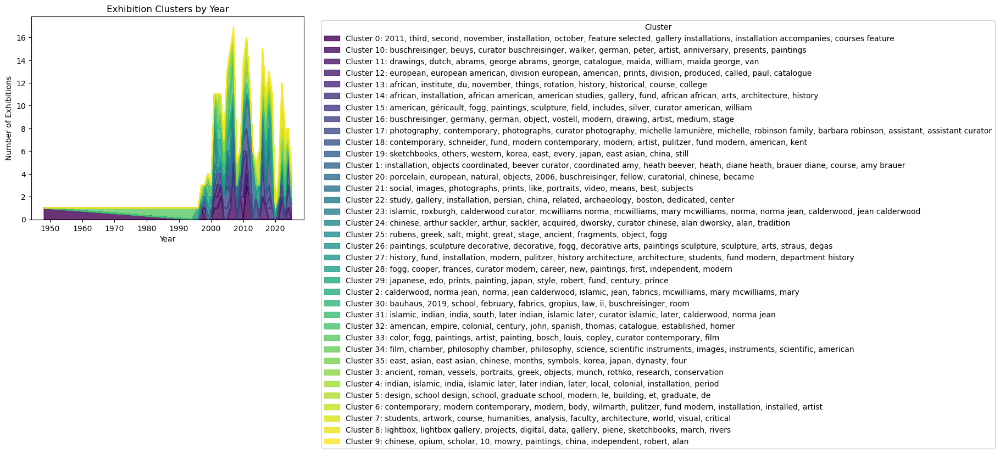

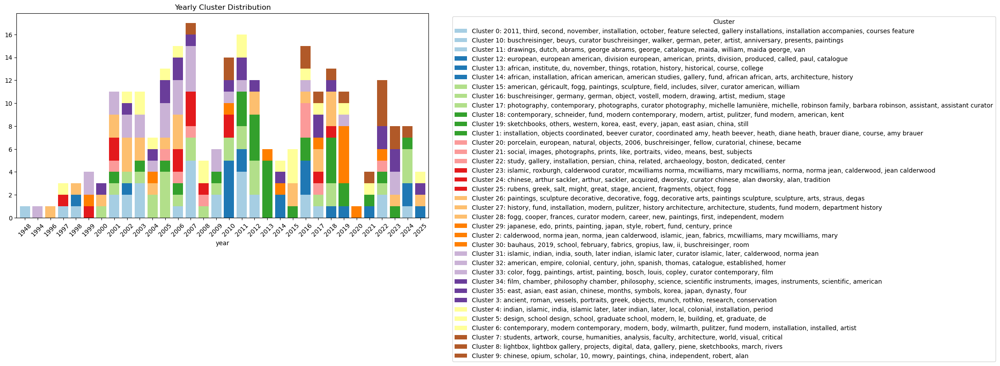

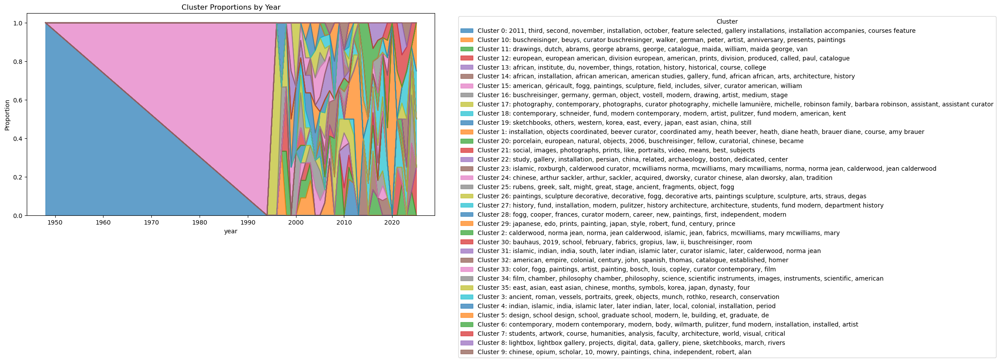

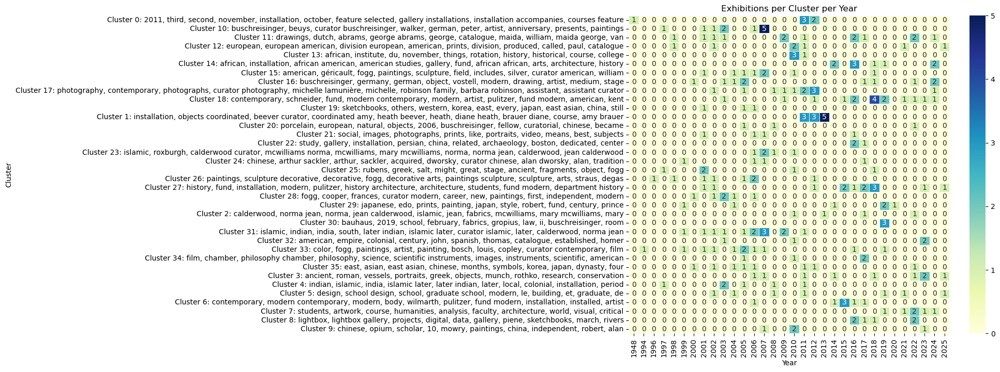

In [59]:
cluster_yearly = des_df.groupby(['year', 'cluster_name']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 10))
cluster_yearly.plot.area(
    stacked=True,
    colormap='viridis',
    alpha=0.8
)
plt.title('Exhibition Clusters by Year')
plt.ylabel('Number of Exhibitions')
plt.xlabel('Year')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

cluster_yearly.plot.bar(
    stacked=True,
    width=0.8,
    figsize=(12, 6),
    colormap='Paired'
)
plt.xticks(rotation=45)
plt.title('Yearly Cluster Distribution')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1))
plt.show()

cluster_yearly.div(cluster_yearly.sum(axis=1), axis=0)\
   .plot.area(
       stacked=True,
       figsize=(12, 6),
       alpha=0.7
   )
plt.title('Cluster Proportions by Year')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1))
plt.ylabel('Proportion')
plt.show()



plt.figure(figsize=(10, 8))
sns.heatmap(
    cluster_yearly.T,  # Transpose for clusters as rows
    annot=True,
    fmt='d',
    cmap='YlGnBu',
    linewidths=.5
)

plt.title('Exhibitions per Cluster per Year')
plt.ylabel('Cluster')
plt.xlabel('Year')
plt.show()

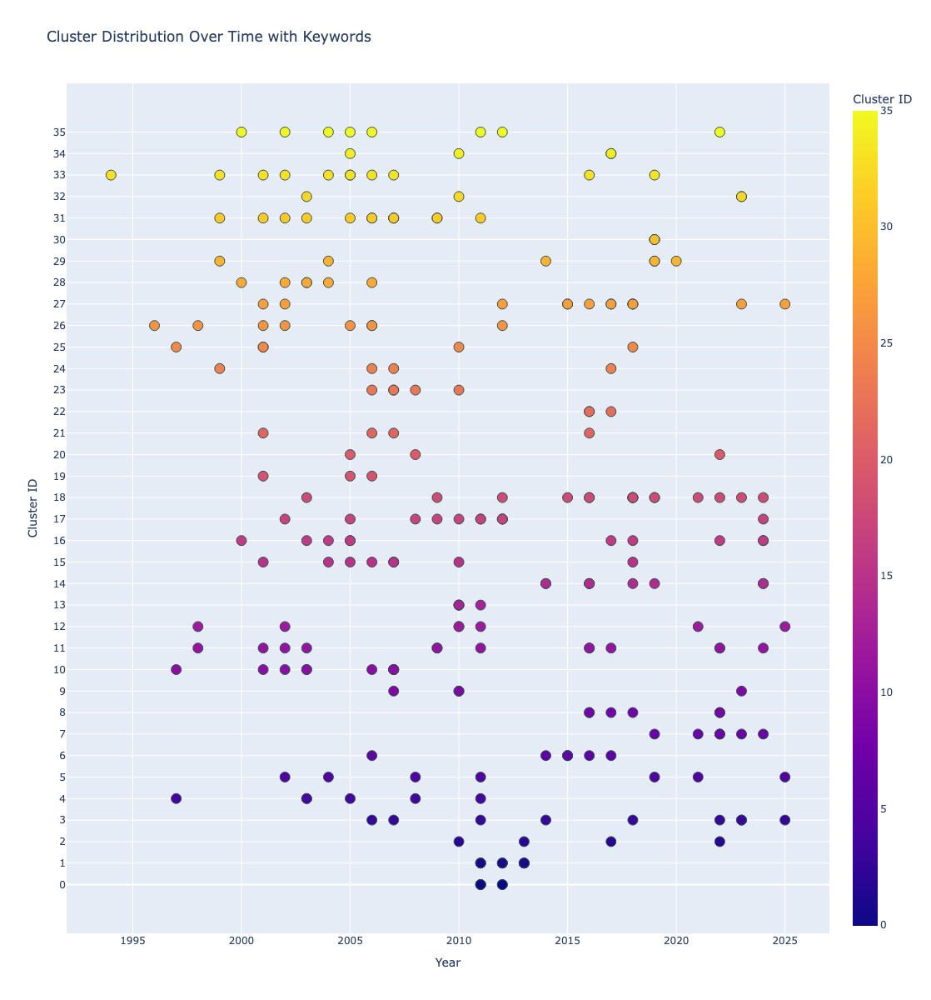

In [63]:
plot_df = des_df[des_df['year'] != 1948].copy()
plot_df['name'] = plot_df['name'].fillna('')
plot_df['title'] = plot_df['title'].fillna('Untitled')  # Handle missing titles

# Create the visualization with additional hover data
fig = px.scatter(plot_df,
                 x='year',
                 y='cluster',
                 color='cluster',
                 hover_name='name',
                 hover_data={
                     'title': True,          # Add artwork titles
                     'cluster_name': True, 
                     'year': True, 
                     'cluster': False
                 },
                 title='Cluster Distribution Over Time with Keywords',
                 labels={'cluster': 'Cluster ID', 'year': 'Year'},
                 height=1200)


fig.update_traces(
    marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')),
    hovertemplate=(
        "Curator: <b>%{hovertext}</b><br>" +        
        "<i>%{customdata[0]}</i><br><br>" +  
        "Year: %{x}<br>" +
        "Cluster: %{y}<br>" +
        "Keywords: %{customdata[1]}<extra></extra>"
    )
)


fig.update_layout(
    xaxis=dict(tickmode='linear', dtick=5),  # Show ticks every 5 years
    yaxis=dict(tickvals=sorted(des_df['cluster'].unique())),
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)

fig.show()

## Try the same thing for titles
This time using a transformer to embed the titles

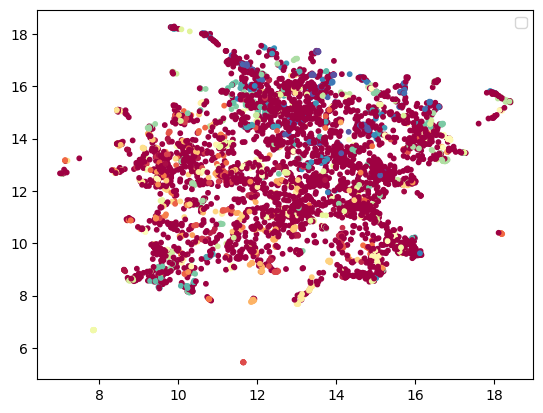

In [66]:
e_df['clean_title'] = e_df['title'].apply(preprocess, remove_words=remove_museum_words)

# Load a lightweight model (good for titles)
#model = SentenceTransformer('all-MiniLM-L6-v2')  # 384-dim embeddings
#model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2') #multilingual
model = SentenceTransformer('all-mpnet-base-v2') # Higher quality (768-dim)

# Embed all titles
# Embed all titles
e_df['title_embedding'] = model.encode(e_df['clean_title'].tolist(), 
                                    convert_to_numpy=True).tolist()

embeddings = np.array(e_df['title_embedding'].tolist())                                
cos_dist = cosine_distances(embeddings)

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=2,
    metric='precomputed', 
    cluster_selection_method='eom'
)

e_df['semantic_cluster_title'] = clusterer.fit_predict(cos_dist)


# 3. Visualize
reducer = umap.UMAP(metric='cosine')
projections = reducer.fit_transform(embeddings)
plt.scatter(projections[:,0], projections[:,1], c=e_df['semantic_cluster_title'], cmap='Spectral', s=10)
plt.legend()
plt.show()

In [67]:
from collections import defaultdict

# Get top titles per cluster
cluster_examples = defaultdict(list)
for clus in e_df['semantic_cluster_title'].unique():
    examples = e_df[e_df['semantic_cluster_title'] == clus]['clean_title'].sample(2, random_state=42)
    cluster_examples[clus] = examples.tolist()

for clus, examples in cluster_examples.items():
    print(f"\nCluster {clus}:")
    print("\n".join(f"- {ex}" for ex in examples))


Cluster 342:
- american photographs
- new american photographs

Cluster -1:
- private
- prints drawings bronzes degas

Cluster 173:
- 32q 1005 south arcade
- 32q 1003 west arcade

Cluster 170:
- 32q 3620 study gallery
- 32q 3610 teaching gallery

Cluster 1:
- harvardsmithsonian center astrophysics
- constellations light dark black white paper 19471954 sam francis

Cluster 134:
- haa 1 survey course s421 landmarks world architecture spring 2009
- landmarks world architecture

Cluster 246:
- haa 10 survey course s421 western tradition since renaissance fall 08 rotation 1
- haa 10 survey course s421 western tradition since renaissance fall 08 rotation 3

Cluster 36:
- review s425a small niche new acquisition lorna simpson
- review s426a large niche haa175w pop

Cluster 293:
- rocks mountains landscapes gardens essence east asian painting 1997
- chinese landscape painting

Cluster 83:
- recent acquisitions 2020
- recent acquisitions part ii building

Cluster 112:
- arts korea
- women arts

In [43]:
cluster_counts = e_df['semantic_cluster_title'].value_counts()
print(len(cluster_counts))
cluster_counts

402


semantic_cluster_title
-1      3234
 392      26
 123      24
 327      23
 173      16
 267      15
 390      15
 400      13
 250      13
 256      12
 389      12
 236      11
 334      11
 372      11
 288      11
 222      11
 295      11
 269      10
 259      10
 192      10
 367      10
 61       10
 76        9
 122       9
 148       9
 276       9
 283       9
 337       9
 131       9
 304       8
 100       8
 85        8
 375       8
 187       8
 125       8
 110       8
 83        8
 299       8
 310       8
 52        7
 378       7
 369       7
 335       7
 240       7
 330       7
 286       7
 157       7
 159       7
 80        7
 396       7
 374       7
 255       7
 107       7
 205       7
 201       7
 318       7
 360       7
 291       7
 349       7
 172       7
 352       7
 119       7
 272       6
 63        6
 273       6
 160       6
 307       6
 176       6
 386       6
 106       6
 399       6
 165       6
 278       6
 298       6
 72        6
 2

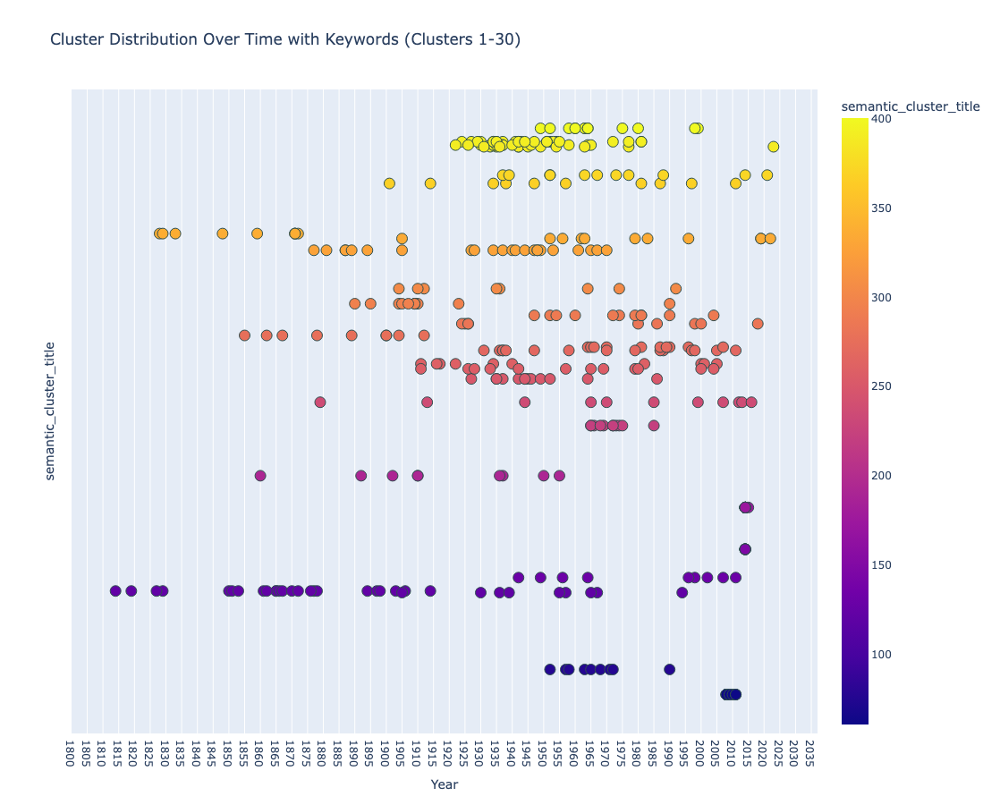

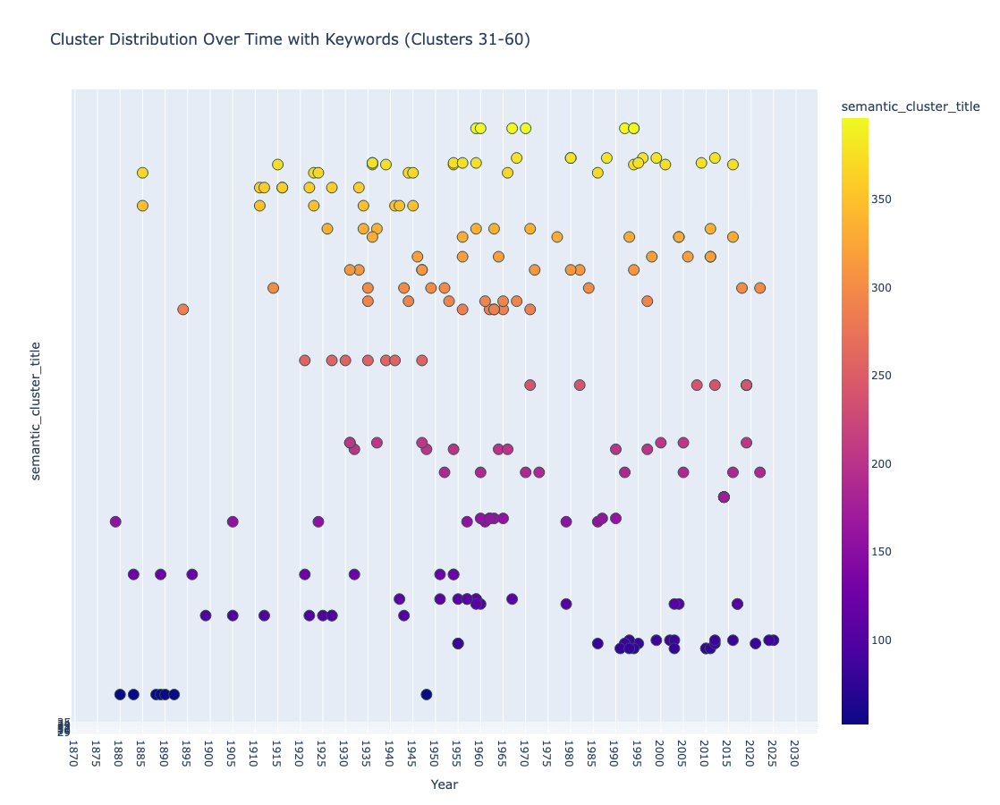

In [82]:

import plotly.express as px

top_clusters_df = e_df[e_df['semantic_cluster_title'].isin(cluster_counts.index[1:30])]


# 1. Prepare your data
plot_df = top_clusters_df.copy()
plot_df['name'] = plot_df['name'].fillna('')
plot_df['title'] = plot_df['title'].fillna('Untitled')  # Handle missing titles

# 2. Create the visualization with additional hover data
fig = px.scatter(plot_df,
                 x='year',
                 y='semantic_cluster_title',
                 color='semantic_cluster_title',
                 hover_name='name',
                 hover_data={
                     'title': True,          # Add artwork titles
                    
                     'year': True, 
                     'semantic_cluster_title': False
                 },
                 title='Cluster Distribution Over Time with Keywords (Clusters 1-30)',
                 labels={'cluster': 'Cluster ID', 'year': 'Year'},
                 height=900)

# 3. Customize hover template with title
fig.update_traces(
    marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')),
    hovertemplate=(
        "Curator: <b>%{hovertext}</b><br>" +        
        "Title: <i>%{customdata[0]}</i><br><br>" +  
        "Year: %{x}<br>" +
        "Cluster: %{y}<br>" 
       
    )
)

# 4. Improve layout
fig.update_layout(
    xaxis=dict(tickmode='linear', dtick=5),  # Show ticks every 5 years
    yaxis=dict(tickvals=sorted(des_df['cluster'].unique())),
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)

fig.show()



next_clusters_df = e_df[e_df['semantic_cluster_title'].isin(cluster_counts.index[30:60])]


# 1. Prepare your data
plot_df = next_clusters_df.copy()
plot_df['name'] = plot_df['name'].fillna('')
plot_df['title'] = plot_df['title'].fillna('Untitled')  # Handle missing titles

# 2. Create the visualization with additional hover data
fig = px.scatter(plot_df,
                 x='year',
                 y='semantic_cluster_title',
                 color='semantic_cluster_title',
                 hover_name='name',
                 hover_data={
                     'title': True,          # Add artwork titles
                    
                     'year': True, 
                     'semantic_cluster_title': False
                 },
                 title='Cluster Distribution Over Time with Keywords (Clusters 31-60)',
                 labels={'cluster': 'Cluster ID', 'year': 'Year'},
                 height=900)

# 3. Customize hover template with title
fig.update_traces(
    marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')),
    hovertemplate=(
        "Curator: <b>%{hovertext}</b><br>" +        
        "Title: <i>%{customdata[0]}</i><br><br>" +  
        "Year: %{x}<br>" +
        "Cluster: %{y}<br>" 
       
    )
)

# 4. Improve layout
fig.update_layout(
    xaxis=dict(tickmode='linear', dtick=5),  # Show ticks every 5 years
    yaxis=dict(tickvals=sorted(des_df['cluster'].unique())),
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    )
)

fig.show()


## Lets look at the most exhibited artists

In [83]:
import ast  # For safely evaluating strings
from itertools import chain

df_list = []
data = exhibited_df.people.values

for json_string in data:
    if pd.isna(json_string):
        df_list.append(None)
    else:
        try:
            # First try direct JSON parsing
            parsed_data = json.loads(json_string)
        except json.JSONDecodeError:
            try:
                # Try fixing common issues
                json_string_fixed = json_string.replace("'", '"')
                parsed_data = json.loads(json_string_fixed)
            except json.JSONDecodeError:
                try:
                    # Last resort - use ast.literal_eval for Python-like syntax
                    parsed_data = ast.literal_eval(json_string)
                except (ValueError, SyntaxError) as e:
                    print(f"Failed to parse: {json_string}")
                    print(f"Error: {str(e)}")
                    parsed_data = None
        
        if parsed_data is not None:
            try:
                normalized_df = pd.json_normalize(parsed_data)
                df_list.append(normalized_df)
            except Exception as e:
                print(f"Normalization failed for: {parsed_data}")
                print(f"Error: {str(e)}")
                df_list.append(None)
        else:
            df_list.append(None)

# Store results
exhibited_df['people_df'] = df_list
exhibited_df.loc[:,'artist'] = exhibited_df.people_df.apply(lambda x: list(x['name']) if isinstance(x, pd.DataFrame) and 'name' in x.columns else [])
exhibited_df.loc[:,'exhibition_dates'] = exhibited_df.exhibitions_df.apply(lambda x: list(x['begindate']) if isinstance(x, pd.DataFrame) and 'begindate' in x.columns else [])
from ast import literal_eval

def get_years(row):
    """Process dates without accidental character-level parsing"""
    dates = []
    for item in row['exhibition_dates']:
        if isinstance(item, list):
            dates.extend(item)  # Flatten nested lists
        else:
            dates.append(item)  # Add single date
    
    years = []
    for date_str in dates:
        try:
            # Handle various date formats
            if pd.notna(date_str) and str(date_str).strip():
                year = pd.to_datetime(date_str, errors='coerce').year
                if not pd.isna(year):
                    years.append(year)
        except Exception as e:
            print(f"Couldn't parse {date_str}: {e}")
    return years

   
exhibited_df.loc[:,'exhibition_years'] = exhibited_df.apply(get_years, axis = 1)


exhibited_df.loc[:,'artist_primary']= exhibited_df['artist'].apply(lambda x: x[0] if x != [] else []) 

artists_exhibited_counts = exhibited_df.artist_primary.value_counts()



artists_exhibited_counts[2:30].plot.bar(
  

    figsize=(14, 6),
   
)
plt.xticks(rotation=85)
plt.title('Number of Times an Artists Unique Work was Exhibited')

plt.show()

NameError: name 'exhibited_df' is not defined

## Now we use AWS Face recognition to talk about the people represented in the art objects.
### We have data on 286,356 faces found in the collection


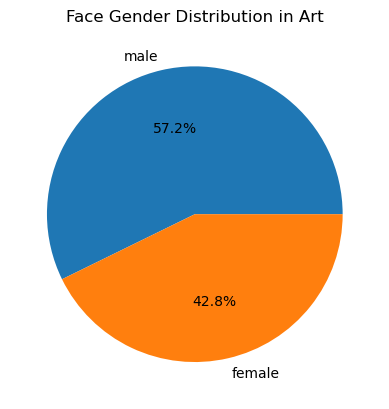

In [93]:
# looking at the AWS face recognition enteries
aws_df = pd.read_csv('aws_face_annotations.csv')

# Extract Age
aws_df['age'] = aws_df['body'].str.extract(r'age: (\d+-\d+)')

# Extract Gender
aws_df['gender'] = aws_df['body'].str.extract(r'gender: (\w+)\(?')
aws_df['gender_confidence'] = aws_df['body'].str.extract(r'gender: \w+\((\d+\.\d+)%\)').astype(float)

# Extract emotions 
all_emotions = []
for idx, row in aws_df.iterrows():
    matches = re.findall(r'([A-Z]+): (\d+\.\d+)%', row['body'])
    for emotion, percent in matches:
        all_emotions.append({
            'original_index': idx,
            'emotion': emotion,
            'percentage': float(percent)
        })

# Create emotion DataFrame
emotion_df = pd.DataFrame(all_emotions)

# Pivot using groupby to avoid duplicates 
emotion_wide = (emotion_df.groupby(['original_index', 'emotion'])
                ['percentage']
                .first()  # Takes first if duplicates exist
                .unstack()
                .astype(float))

# Join with original data
aws_df = aws_df.join(emotion_wide)



aws_df['first_emotion'] = aws_df['body'].str.extract(r'<br/>([A-Z]+): \d+\.\d+%')


aws_df['raw_dict'] = aws_df['raw'].apply(ast.literal_eval)

def classify_gaze(raw, confidence_threshold=40):
    """Robust gaze classification with comprehensive error handling"""
    # Handle missing/invalid data cases
    if pd.isna(raw):
        return 'bad_data'
        
    try:
        # Handle both string and dict input like safe_extract
        if isinstance(raw, str):
            try:
                data = json.loads(raw)
            except json.JSONDecodeError:
                return 'bad_data'
        else:
            data = raw
            
        # Safely access EyeDirection with nested get()
        eye_data = data.get('EyeDirection', {})
        if not eye_data:  # Empty dict means no eye data
            return 'bad_data'
            
        # Extract values with defaults
        conf = eye_data.get('Confidence', 0)
        yaw = abs(eye_data.get('Yaw', 0))
        
        # Classification logic
        if conf < confidence_threshold:
            return 'low_conf'
        elif yaw < 10:
            return 'straight_gaze'
        elif 10 <= yaw <= 20:
            return 'side_gaze'
        else:
            return 'no_gaze'
            
    except Exception as e:  # Catch any unexpected errors
        print(f"Error processing gaze data: {e}")
        return 'bad_data'

# Apply to DataFrame
aws_df['gaze_classification'] = aws_df['raw_dict'].apply(classify_gaze)


#aws_df['smile'] = aws_df['raw'].apply(lambda x: x['Smile']['Value'])
#aws_df['MouthOpen'] = aws_df['raw'].apply(lambda x: x['MouthOpen']['Value'])
#aws_df['EyesOpen'] = aws_df['raw'].apply(lambda x: x['EyesOpen']['Value'])

def safe_extract(row, primary_key, secondary_key, default=None):
    """Safely extract nested dictionary values"""
    if pd.isna(row):
        return default
        
    try:
        # Handle both dict and JSON string cases
        if isinstance(row, str):
            data = json.loads(row)
        else:
            data = row
            
        return data.get(primary_key, {}).get(secondary_key, default)
    except (AttributeError, KeyError, json.JSONDecodeError):
        return default

# Apply to all features
aws_df['smile'] = aws_df['raw_dict'].apply(lambda x: safe_extract(x, 'Smile', 'Value', False))
aws_df['MouthOpen'] = aws_df['raw_dict'].apply(lambda x: safe_extract(x, 'MouthOpen', 'Value', False))
aws_df['EyesOpen'] = aws_df['raw_dict'].apply(lambda x: safe_extract(x, 'EyesOpen', 'Value', False))


male_df = aws_df[aws_df.gender=='Male']
female_df = aws_df[aws_df.gender=='Female']


from itertools import chain

# Sample Data

# Step 1: Convert ranges to lists of ages
aws_df['ages'] =aws_df['age'].apply(
    lambda x: list(range(int(x.split('-')[0]), int(x.split('-')[1]) + 1))
)


male_df = aws_df[aws_df.gender=='Male']
female_df = aws_df[aws_df.gender=='Female']
num_m = round(len(male_df)/len(aws_df)*100,2)
num_f = round(len(female_df)/len(aws_df)*100,2)


# Step 2: Flatten all ages
male_ages = list(chain.from_iterable(male_df['ages']))
female_ages =  list(chain.from_iterable(female_df['ages']))

plt.pie([num_m, num_f], labels=['male','female'], autopct='%1.1f%%')
plt.title("Face Gender Distribution in Art")
plt.show()

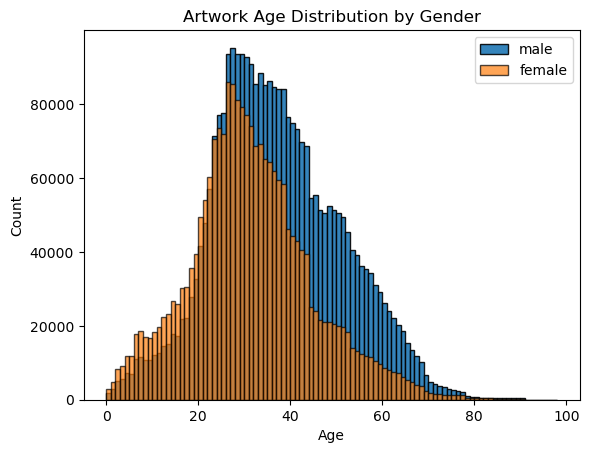

In [94]:
# Step 3: Plot
bins = np.arange(min(male_ages + female_ages), max(male_ages + female_ages) + 2)
plt.hist(male_ages, bins=bins, edgecolor='black', label = 'male', alpha=0.9)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Artwork Age Distribution by Gender')

plt.hist(female_ages, bins=bins, edgecolor='black', label = 'female', alpha=0.7)
plt.legend()
plt.show()

Average female age is: 31.01. 
 Average male age is: 36.69


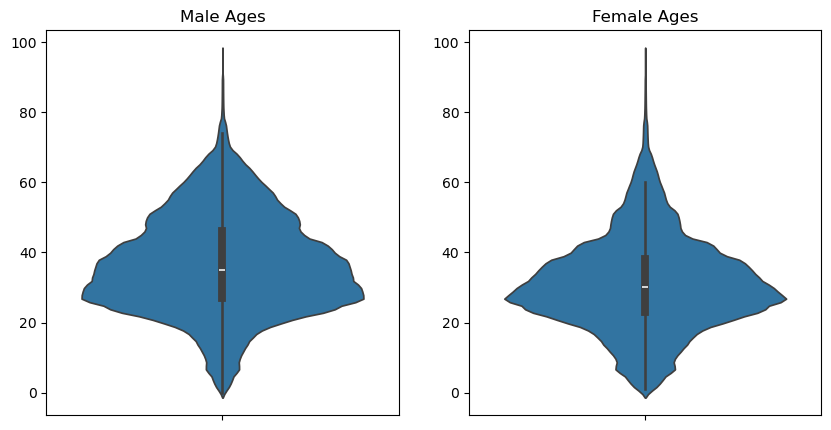

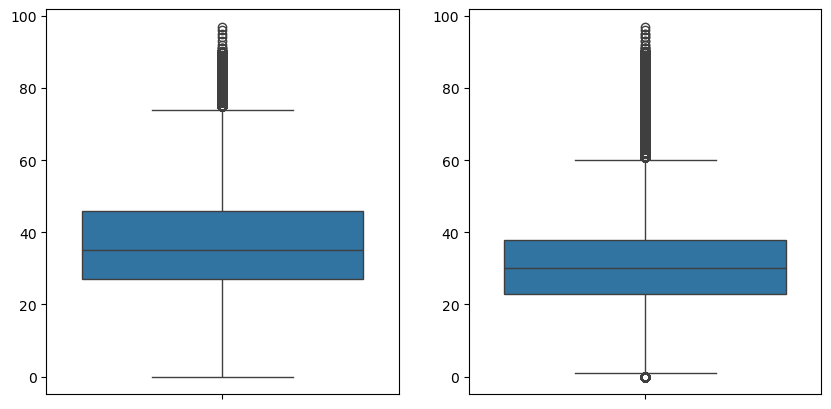

In [95]:
print(f"Average female age is: {round(np.mean(female_ages), 2)}. \n Average male age is: {round(np.mean(male_ages),2)}")
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axes[0].set_title(f"Male Ages")
sns.violinplot(male_ages, label = 'male', ax=axes[0])
axes[1].set_title(f"Female Ages")
sns.violinplot(female_ages, label = 'female', ax=axes[1])
plt.show()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
sns.boxplot(male_ages, label = 'male', ax=axes[0])
sns.boxplot(female_ages, label = 'female', ax=axes[1])
plt.show()

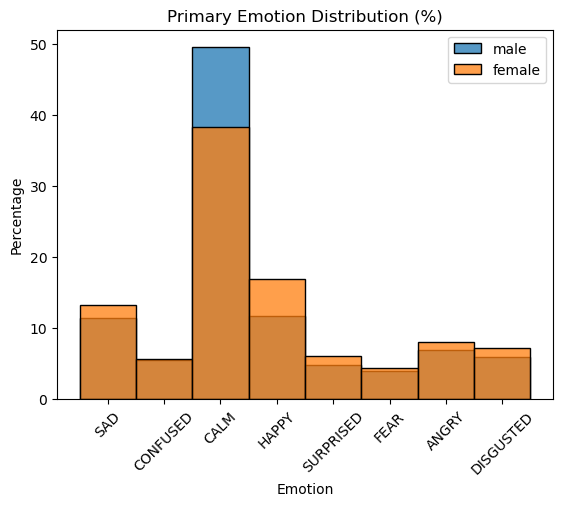

In [96]:

sns.histplot(data=male_df.reset_index(), x='first_emotion', stat='percent', discrete=True, label = 'male')
sns.histplot(data=female_df.reset_index(), x='first_emotion', stat='percent', discrete=True, label ='female')
plt.title('Primary Emotion Distribution (%)')
plt.xlabel('Emotion')
plt.ylabel('Percentage')
plt.legend()
plt.xticks(rotation=45)
plt.show()

ANGRY 1.928045 14.126399745477725 2.64739 14.126399745477725
CALM 52.332598 56.591701713678844 49.550758 56.591701713678844
CONFUSED 1.889152 13.699250638435256 2.216311 13.699250638435256
DISGUSTED 0.9813215 12.264021829467115 1.5310025 12.264021829467115
FEAR 2.213297 10.360356056744786 2.1639345 10.360356056744786
HAPPY 1.798896 18.138128892144078 9.815443 18.138128892144078
SAD 4.747918 20.740359067283464 11.6978625 20.740359067283464
SURPRISED 4.9772525000000005 13.942812918596145 6.324136 13.942812918596145


,ANGRY,CALM,CONFUSED,DISGUSTED,FEAR,HAPPY,SAD,SURPRISED
Male Mean,0.141264,0.565917,0.136993,0.12264,0.103604,0.181381,0.207404,0.139428
Female Mean,0.175932,0.489618,0.166925,0.16354,0.112723,0.266034,0.258674,0.181107


,ANGRY,CALM,CONFUSED,DISGUSTED,FEAR,HAPPY,SAD,SURPRISED
Male Median,0.019280,0.523326,0.018892,0.009813,0.022133,0.017989,0.047479,0.049773
Female Median,0.026474,0.495508,0.022163,0.015310,0.021639,0.098154,0.116979,0.063241


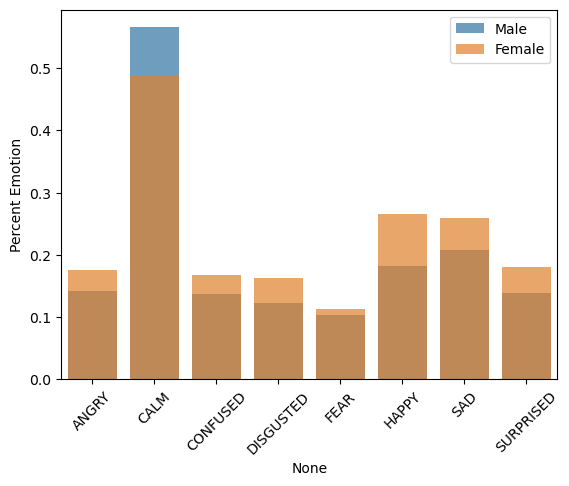

In [97]:
emotion_cols = ['ANGRY', 'CALM', 'CONFUSED', 'DISGUSTED', 'FEAR', 'HAPPY',	'SAD', 'SURPRISED']
emotion_dict = {}
med_emotion_dict={}

for col in emotion_cols:
    print(col, male_df[col].median(), male_df[col].mean(),  female_df[col].median(), male_df[col].mean())
    
    emotion_dict.update({col:[ male_df[col].mean()/100,female_df[col].mean()/100] })
    med_emotion_dict.update({col:[ male_df[col].median()/100,female_df[col].median()/100] })

emotion_df = pd.DataFrame(emotion_dict, index = ['Male Mean', 'Female Mean'])
median_emotion_df = pd.DataFrame(med_emotion_dict, index = ['Male Median', 'Female Median'])
display(emotion_df)
display(median_emotion_df)
sns.barplot(x = emotion_df.columns, y = emotion_df.iloc[0], label = 'Male', alpha = .7)
sns.barplot(x = emotion_df.columns, y = emotion_df.iloc[1], label = 'Female', alpha = .7)
plt.xticks(rotation=45)
plt.ylabel('Percent Emotion')
plt.show()

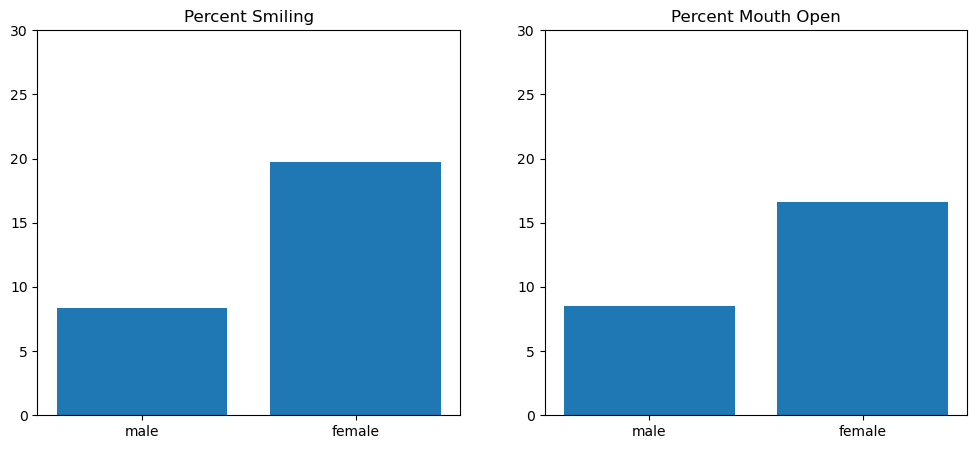

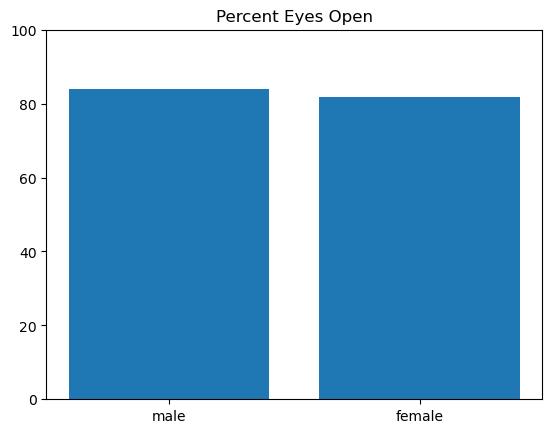

gaze_classification
bad_data         251413
no_gaze             241
low_conf            160
straight_gaze       153
side_gaze           124
Name: count, dtype: int64
gaze_classification
bad_data         187707
low_conf            139
no_gaze             136
straight_gaze       125
side_gaze           102
Name: count, dtype: int64


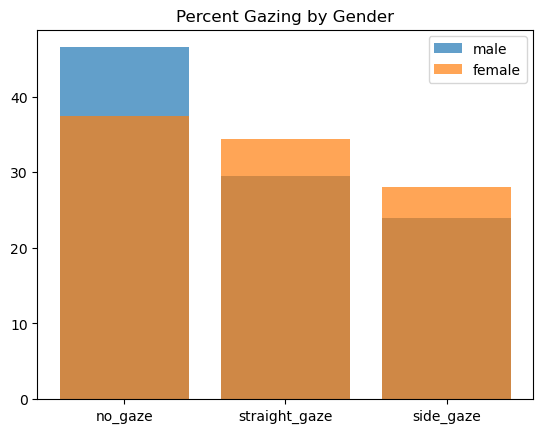

In [98]:

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
axes[0].bar(height = [male_df['smile'].value_counts()[1]/len(male_df)*100,female_df['smile'].value_counts()[1]/len(female_df)*100] ,
        x = ['male', 'female'])
axes[0].set_title("Percent Smiling")
axes[0].set_ylim(0, 30)
axes[1].bar(height = [male_df['MouthOpen'].value_counts()[1]/len(male_df)*100,female_df['MouthOpen'].value_counts()[1]/len(female_df)*100] ,
        x = ['male', 'female'])
axes[1].set_title("Percent Mouth Open")
axes[1].set_ylim(0, 30)
plt.show()
plt.bar(height = [male_df['EyesOpen'].value_counts()[0]/len(male_df)*100,female_df['EyesOpen'].value_counts()[0]/len(female_df)*100] ,
        x = ['male', 'female'])
plt.title("Percent Eyes Open")
plt.ylim(0, 100)
plt.show()
gaze =['no_gaze', 'straight_gaze', 'side_gaze'] 
print(male_df['gaze_classification'].value_counts())
print(female_df['gaze_classification'].value_counts())
m_gaze = male_df['gaze_classification'][male_df['gaze_classification'].isin(gaze)].value_counts()
f_gaze = female_df['gaze_classification'][female_df['gaze_classification'].isin(gaze)].value_counts()
plt.bar(height = 100* m_gaze/len(male_df['gaze_classification'][male_df['gaze_classification'].isin(gaze)]), 
        x = m_gaze.index, alpha = .7, label = 'male')
plt.bar(height = 100*f_gaze/len(female_df['gaze_classification'][female_df['gaze_classification'].isin(gaze)]), 
        alpha =.7, x = f_gaze.index, label = 'female')
plt.title("Percent Gazing by Gender")
plt.legend()
plt.show()


## Recommendations:

* Create a warning or forward-facing text that acknowledges the significance of preserving historically derogatory terms while simultaneously promoting a new antiracist perspective.

* Attempt to gather and showcase underrepresented groups, including women. Achieving this goal requires a means to represent the unique characteristics, cultures, and identities of these communities so that improvements are quantifiable.

* Introduce an identity subfield within the ‘person’ section of each record. This field will encompass the identities that the artist or object-related person themselves identifies with. Examples include Black, Asian American, Disabled, Queer, Minority, Neurodivergent, Swiss Indian, etc. This field can also be utilized to create more precise levels of cultural description, such as Chalchiteco instead of Guatemalan.
